## Problem Statement:
Business case:

Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.
In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made.

- In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not. 

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import scipy
from scipy.stats import zscore

import warnings
warnings.filterwarnings("ignore")

In [2]:
df1=pd.read_csv("automobile_fraud.csv")

In [3]:
df=pd.DataFrame(data=df1)

In [4]:
df.head(5)

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


In [5]:
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)

In [6]:
df.head(5)

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


In [7]:
df.tail(5)

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,22-02-2015,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,6045 Andromedia St,20,1,YES,0,1,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,24-01-2015,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,3092 Texas Drive,23,1,YES,2,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,23-01-2015,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,7629 5th St,4,3,?,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,26-02-2015,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,6128 Elm Lane,2,1,?,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN
999,456,60,556080,11-11-1996,OH,250/500,1000,766.19,0,612260,FEMALE,Associate,sales,kayaking,husband,0,0,26-02-2015,Parked Car,?,Minor Damage,Police,WV,Columbus,1416 Cherokee Ridge,6,1,?,0,3,?,5060,460,920,3680,Mercedes,E400,2007,N,NaN


In [8]:
# shape
df.shape

(1000, 40)

In [9]:
type(df)

pandas.core.frame.DataFrame

In [10]:
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

In [11]:
# size of the data
df.size

40000

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

## Observation

dtypes: 

- float64 shows 2 columns
- int64 shows 17 columns
- object shows 21 columns

# Unique Values

In [13]:
df.nunique()

months_as_customer              391
age                              46
policy_number                  1000
policy_bind_date                951
policy_state                      3
policy_csl                        3
policy_deductable                 3
policy_annual_premium           991
umbrella_limit                   11
insured_zip                     995
insured_sex                       2
insured_education_level           7
insured_occupation               14
insured_hobbies                  20
insured_relationship              6
capital-gains                   338
capital-loss                    354
incident_date                    60
incident_type                     4
collision_type                    4
incident_severity                 4
authorities_contacted             5
incident_state                    7
incident_city                     7
incident_location              1000
incident_hour_of_the_day         24
number_of_vehicles_involved       4
property_damage             

### Checking  Unique Values in Object Columns

In [14]:
for i in df.columns:
    if df[i].dtype=='object':
        print(" Column Name ",i ,"\n",df[i].unique(),'\n')
        print("****"*20)

 Column Name  policy_bind_date 
 ['17-10-2014' '27-06-2006' '06-09-2000' '25-05-1990' '06-06-2014'
 '12-10-2006' '04-06-2000' '03-02-1990' '05-02-1997' '25-07-2011'
 '26-05-2002' '29-05-1999' '20-11-1997' '26-10-2012' '28-12-1998'
 '19-10-1992' '08-06-2005' '15-11-2004' '28-12-2014' '02-08-1992'
 '25-06-2002' '27-11-2005' '27-05-1994' '08-02-1991' '02-02-1996'
 '05-12-2013' '20-09-1990' '18-07-2002' '08-02-1990' '04-03-2014'
 '18-02-2000' '19-06-2008' '01-08-2003' '04-04-1992' '13-01-1991'
 '08-08-2010' '09-03-2003' '03-02-1993' '25-11-2002' '27-07-1997'
 '08-05-1995' '30-08-2012' '30-04-2006' '13-04-2003' '05-12-2007'
 '21-08-2006' '08-01-1990' '18-03-1990' '07-01-2008' '10-03-1997'
 '10-01-2004' '20-08-1994' '02-06-2002' '28-04-1994' '17-08-2014'
 '11-08-2007' '20-11-2008' '18-10-1995' '19-05-1993' '26-02-2005'
 '14-02-1990' '30-09-1993' '10-06-2014' '28-10-2008' '24-04-2007'
 '13-12-1993' '17-08-2011' '20-08-1990' '11-02-1994' '22-02-1994'
 '15-08-2011' '11-11-1998' '04-12-1995' '28

## Column Showing Null Values as (?)

- Collision_Type
- Property_Damage
- Police_report_available

### Checking  Unique Values in Float Columns

In [15]:
# Numerical Columns
for i in df.columns:
    if df[i].dtype=='float64':
        print("Column ",i,"\n")
        print(df[i].unique())
        print("*****"*10)

Column  policy_annual_premium 

[1406.91 1197.22 1413.14 1415.74 1583.91 1351.1  1333.35 1137.03 1442.99
 1315.68 1253.12 1137.16 1215.36  936.61 1301.13 1131.4  1199.44  708.64
 1374.22 1475.73 1187.96  875.15  972.18 1268.79  883.31 1266.92 1322.1
  848.07 1291.7  1104.5   954.16 1337.28 1088.34 1558.29 1415.68 1334.15
  988.45 1222.48 1155.55 1262.08 1451.62 1737.66 1475.93  538.17 1081.08
 1454.43 1240.47 1273.7  1123.87 1245.89 1326.62 1073.83 1530.52 1201.41
 1393.57 1276.57 1082.49 1414.74 1470.06  870.63  795.23 1168.2   993.51
 1848.81 1641.73 1362.87 1239.22  835.02 1061.33 1279.08 1105.49 1055.53
  895.83 1632.93 1405.99 1425.54 1038.09 1307.11 1489.24  976.67 1340.43
 1267.81 1234.2  1318.06  769.95 1514.72  873.64 1612.43 1318.24 1226.83
 1326.44 1136.83 1322.78 1483.25 1515.3  1075.18 1690.27 1352.83 1148.73
  969.5  1463.82 1474.17 1497.35 1427.14 1495.1  1141.62 1125.37 1207.36
 1338.5  1074.07 1337.56 1298.91 1222.75 1059.52 1124.38 1110.37 1103.58
 1269.76  964.79 116

- c39 column shows nan Values

### Checking  Unique Values in Integer Columns

In [16]:
# Numerical Columns
for i in df.columns:
    if df[i].dtype=='int64':
        print("Column ",i,"\n")
        print(df[i].unique())
        print("*****"*10)

Column  months_as_customer 

[328 228 134 256 137 165  27 212 235 447  60 121 180 473  70 140 160 196
 460 217 370 413 237   8 257 202 224 241  64 166 155 114 149 147  62 289
 431 199  79 116  37 106 269 265 163 355 175 192 430  91 223 195  22 439
  94  11 151 154 245 119 215 295 254 107 478 128 338 271 222 120 270 319
 194 227 244  78 200 284 275 153  31  41 127  61 207 219  80 325  29 239
 279 350 464 118 298  87 261 453 210 168 390 258 225 164 255 206 203 211
 274  81 280 112  24  93 171 124 287 122 398 214 209  82 193 288 104 101
 375 461 428  45 136 216 278 108  14 276  47  73 294 324  53 426 111  86
 296 125 177 238 449 252 359  19 285  30 342 468 343 404  63 335 142 272
  69  38 281 246 330 362 371 377 172  99 249 190 174  95   2 117 242 440
  20 208 156 232  84 394  35 369 332 243 264  32 259 186 201 436 189 105
  88  40  59  39 123 231 247  48 267 286 253  10 158   1  85 233 266  97
 399 305 129 283  96 176 159 290 299  66 334 429  15 230 250  65 475  77
 229 110 292 451 150 2

- Integer columns shows no nan values

# Checking Duplicated Rows

In [17]:
df.duplicated().sum()

0

- Nill Duplicated Rows

### Replacing Missing Values as np.nan

In [18]:
# replacing columns:
for i in df.columns:
    df[i] = df[i].replace(to_replace='?', value=np.nan)

In [19]:
df.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                  178
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

## Checking Missing Percentage

In [20]:
for i in df.columns:
    Total_Value=len(df[i])
    Missing_Value=df[i].isnull().sum()
    
    print(i ,"  Missing percentage :",round(((Missing_Value/Total_Value)*100),2))

months_as_customer   Missing percentage : 0.0
age   Missing percentage : 0.0
policy_number   Missing percentage : 0.0
policy_bind_date   Missing percentage : 0.0
policy_state   Missing percentage : 0.0
policy_csl   Missing percentage : 0.0
policy_deductable   Missing percentage : 0.0
policy_annual_premium   Missing percentage : 0.0
umbrella_limit   Missing percentage : 0.0
insured_zip   Missing percentage : 0.0
insured_sex   Missing percentage : 0.0
insured_education_level   Missing percentage : 0.0
insured_occupation   Missing percentage : 0.0
insured_hobbies   Missing percentage : 0.0
insured_relationship   Missing percentage : 0.0
capital-gains   Missing percentage : 0.0
capital-loss   Missing percentage : 0.0
incident_date   Missing percentage : 0.0
incident_type   Missing percentage : 0.0
collision_type   Missing percentage : 17.8
incident_severity   Missing percentage : 0.0
authorities_contacted   Missing percentage : 0.0
incident_state   Missing percentage : 0.0
incident_city   

### Droping Columns with missing values higher than 80 percentage

In [21]:
df.drop(['_c39'],axis=1,inplace=True)

In [22]:
df[df['police_report_available'].isnull()]

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,NaN,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,NaN,0,0,NaN,5070,780,780,3510,Mercedes,E400,2007,Y
6,137,34,413978,04-06-2000,IN,250/500,1000,1333.35,0,441716,MALE,PhD,prof-specialty,board-games,husband,0,-77000,13-01-2015,Multi-vehicle Collision,Front Collision,Minor Damage,Police,NY,Springfield,5846 Weaver Drive,0,3,NaN,0,0,NaN,78650,21450,7150,50050,Nissan,Pathfinder,2012,N
9,212,42,636550,25-07-2011,IL,100/300,500,1315.68,0,600983,MALE,PhD,priv-house-serv,camping,wife,0,-39300,05-01-2015,Single Vehicle Collision,Rear Collision,Total Loss,Other,NC,Hillsdale,3066 Francis Ave,14,1,NO,2,1,NaN,42300,4700,4700,32900,Saab,92x,1996,N
10,235,42,543610,26-05-2002,OH,100/300,500,1253.12,4000000,462283,FEMALE,Masters,exec-managerial,dancing,other-relative,38400,0,06-01-2015,Single Vehicle Collision,Front Collision,Total Loss,Police,NY,Northbend,1558 1st Ridge,22,1,YES,2,2,NaN,87010,7910,15820,63280,Ford,F150,2002,N
20,460,62,183430,25-06-2002,IN,250/500,1000,1187.96,4000000,618845,MALE,JD,other-service,bungie-jumping,own-child,0,0,01-01-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,5380 Pine St,20,3,NO,1,0,NaN,47160,0,5240,41920,Suburu,Impreza,2011,N
21,217,41,431876,27-11-2005,IL,500/1000,2000,875.15,0,442479,FEMALE,Associate,machine-op-inspct,skydiving,own-child,46700,0,10-02-2015,Multi-vehicle Collision,Side Collision,Total Loss,Police,SC,Arlington,8957 Weaver Drive,15,3,NaN,1,2,NaN,37840,0,4730,33110,Accura,RSX,1996,N
23,413,55,115399,08-02-1991,IN,100/300,2000,1268.79,0,453148,MALE,MD,priv-house-serv,chess,own-child,0,-31000,19-01-2015,Single Vehicle Collision,Front Collision,Total Loss,Ambulance,WV,Northbend,5667 4th Drive,15,1,NaN,2,2,NaN,98160,8180,16360,73620,Dodge,RAM,2011,Y
27,202,34,608513,18-07-2002,IN,100/300,500,848.07,3000000,607730,MALE,JD,exec-managerial,chess,not-in-family,31000,-30200,07-01-2015,Vehicle Theft,NaN,Minor Damage,None,VA,Northbrook,3790 Andromedia Hwy,5,1,YES,2,1,NaN,5720,1040,520,4160,Suburu,Forrestor,2003,Y
30,64,25,908616,18-02-2000,IL,250/500,1000,954.16,0,473328,MALE,Masters,prof-specialty,video-games,husband,53200,0,18-01-2015,Multi-vehicle Collision,Side Collision,Major Damage,Ambulance,SC,Columbus,4687 5th Drive,22,4,NO,0,0,NaN,75600,12600,12600,50400,Toyota,Corolla,2005,N
31,166,37,666333,19-06-2008,IL,100/300,2000,1337.28,8000000,610393,MALE,JD,craft-repair,reading,husband,27500,0,28-02-2015,Multi-vehicle Collision,Side Collision,Major Damage,Police,WV,Riverwood,9038 2nd Lane,10,3,NO,2,2,NaN,67140,7460,7460,52220,Ford,F150,2006,Y


# Replacing Null Values

In [23]:
from sklearn.impute import SimpleImputer
si_cat=SimpleImputer(missing_values=np.NaN,strategy='most_frequent')
si_num=SimpleImputer(missing_values=np.NaN,strategy='median')

#  Replace Categorical Variable
for i in df.columns:
    if df[i].dtype=='object':
        df[i]=si_cat.fit_transform(df[i].values.reshape(-1,1))
        
# Replace Numerical and float value:

for i in df.columns:
    if df[i].dtype=='float64':
        df[i]=si_num.fit_transform(df[i].values.reshape(-1,1))

In [24]:
df.isnull().sum()

months_as_customer             0
age                            0
policy_number                  0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_rep

In [25]:
df.head(15)

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,Rear Collision,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,NO,0,0,NO,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,NO,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,Rear Collision,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
5,256,39,104594,12-10-2006,OH,250/500,1000,1351.10,0,478456,FEMALE,PhD,tech-support,bungie-jumping,unmarried,0,0,02-01-2015,Multi-vehicle Collision,Rear Collision,Major Damage,Fire,SC,Arlington,8973 Washington St,19,3,NO,0,2,NO,64100,6410,6410,51280,Saab,95,2003,Y
6,137,34,413978,04-06-2000,IN,250/500,1000,1333.35,0,441716,MALE,PhD,prof-specialty,board-games,husband,0,-77000,13-01-2015,Multi-vehicle Collision,Front Collision,Minor Damage,Police,NY,Springfield,5846 Weaver Drive,0,3,NO,0,0,NO,78650,21450,7150,50050,Nissan,Pathfinder,2012,N
7,165,37,429027,03-02-1990,IL,100/300,1000,1137.03,0,603195,MALE,Associate,tech-support,base-jumping,unmarried,0,0,27-02-2015,Multi-vehicle Collision,Front Collision,Total Loss,Police,VA,Columbus,3525 3rd Hwy,23,3,NO,2,2,YES,51590,9380,9380,32830,Audi,A5,2015,N
8,27,33,485665,05-02-1997,IL,100/300,500,1442.99,0,601734,FEMALE,PhD,other-service,golf,own-child,0,0,30-01-2015,Single Vehicle Collision,Front Collision,Total Loss,Police,WV,Arlington,4872 Rock Ridge,21,1,NO,1,1,YES,27700,2770,2770,22160,Toyota,Camry,2012,N
9,212,42,636550,25-07-2011,IL,100/300,500,1315.68,0,600983,MALE,PhD,priv-house-serv,camping,wife,0,-39300,05-01-2015,Single Vehicle Collision,Rear Collision,Total Loss,Other,NC,Hillsdale,3066 Francis Ave,14,1,NO,2,1,NO,42300,4700,4700,32900,Saab,92x,1996,N


## Checking for Fraud:

In [26]:
# Checking if sum of all claims is more is not equal to Total_Claim_Amount:
df[df['total_claim_amount']!=df['injury_claim']+df['property_claim']+df['vehicle_claim']]

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported


### No fraud is Detected on the basis of Total_Claim_Amout Settlement

In [27]:
for i in df.columns:
    if df[i].dtype=='int64':
        print(i," ",df[df[i]<0].shape[0])

months_as_customer   0
age   0
policy_number   0
policy_deductable   0
umbrella_limit   1
insured_zip   0
capital-gains   0
capital-loss   525
incident_hour_of_the_day   0
number_of_vehicles_involved   0
bodily_injuries   0
witnesses   0
total_claim_amount   0
injury_claim   0
property_claim   0
vehicle_claim   0
auto_year   0


#### Found Suspicious rows

In [28]:
for i in df.columns:
    if df[i].dtype=='float64':
        print(i," ",df[df[i]<0].shape[0])

policy_annual_premium   0


In [29]:
df[df['umbrella_limit']<0]

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
290,284,42,526039,04-05-1995,OH,100/300,500,1338.54,-1000000,438178,MALE,Associate,machine-op-inspct,kayaking,wife,0,0,29-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Ambulance,NC,Arlington,3936 Tree Drive,13,1,YES,0,1,NO,94160,8560,17120,68480,Chevrolet,Malibu,1996,N


In [30]:
df[df['capital-loss']<0]

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,NO,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,Rear Collision,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
6,137,34,413978,04-06-2000,IN,250/500,1000,1333.35,0,441716,MALE,PhD,prof-specialty,board-games,husband,0,-77000,13-01-2015,Multi-vehicle Collision,Front Collision,Minor Damage,Police,NY,Springfield,5846 Weaver Drive,0,3,NO,0,0,NO,78650,21450,7150,50050,Nissan,Pathfinder,2012,N
9,212,42,636550,25-07-2011,IL,100/300,500,1315.68,0,600983,MALE,PhD,priv-house-serv,camping,wife,0,-39300,05-01-2015,Single Vehicle Collision,Rear Collision,Total Loss,Other,NC,Hillsdale,3066 Francis Ave,14,1,NO,2,1,NO,42300,4700,4700,32900,Saab,92x,1996,N
11,447,61,214618,29-05-1999,OH,100/300,2000,1137.16,0,615561,FEMALE,High School,exec-managerial,skydiving,other-relative,0,-51000,15-02-2015,Multi-vehicle Collision,Front Collision,Major Damage,Fire,SC,Springfield,5971 5th Hwy,21,3,YES,1,2,YES,114920,17680,17680,79560,Audi,A3,2006,N
13,121,34,626808,26-10-2012,OH,100/300,1000,936.61,0,464652,FEMALE,MD,armed-forces,bungie-jumping,wife,52800,-32800,08-01-2015,Parked Car,Rear Collision,Minor Damage,None,SC,Springfield,6582 Elm Lane,5,1,NO,1,1,NO,7280,1120,1120,5040,Toyota,Highlander,2010,N
14,180,38,644081,28-12-1998,OH,250/500,2000,1301.13,0,476685,FEMALE,College,machine-op-inspct,board-games,not-in-family,41300,-55500,15-01-2015,Single Vehicle Collision,Rear Collision,Total Loss,Police,SC,Springfield,6851 3rd Drive,12,1,NO,0,2,YES,46200,4200,8400,33600,Dodge,Neon,2003,Y
18,160,37,921202,28-12-2014,OH,500/1000,500,1374.22,0,472135,FEMALE,MD,craft-repair,yachting,other-relative,45500,-37800,19-01-2015,Single Vehicle Collision,Side Collision,Total Loss,Other,NY,Northbrook,3842 Solo Ridge,19,1,YES,1,0,NO,72930,6630,13260,53040,Accura,TL,2015,N
19,196,39,143972,02-08-1992,IN,500/1000,2000,1475.73,0,477670,FEMALE,High School,handlers-cleaners,camping,own-child,57000,-27300,22-02-2015,Multi-vehicle Collision,Side Collision,Major Damage,Police,VA,Columbus,8101 3rd Ridge,8,3,NO,2,0,NO,60400,6040,6040,48320,Nissan,Pathfinder,2014,N
22,370,55,285496,27-05-1994,IL,100/300,2000,972.18,0,443920,MALE,High School,prof-specialty,paintball,other-relative,72700,-68200,11-01-2015,Multi-vehicle Collision,Rear Collision,Major Damage,Ambulance,SC,Hillsdale,2526 Embaracadero Ave,20,3,NO,0,0,YES,71520,17880,5960,47680,Suburu,Forrestor,2000,Y


In [31]:
# defective column showing negative umbrella_limit:hence droping
df.drop([290],inplace=True)

In [32]:
# re-confirming delete
df[df['umbrella_limit']<0].shape[0]

0

## Droping Columns With Less Importance

In [33]:
df.drop(['policy_number','policy_bind_date','incident_location'],inplace=True,axis=1)

In [34]:
df.head(5)

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,Rear Collision,Minor Damage,Police,VA,Riverwood,8,1,NO,0,0,NO,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,5,1,NO,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,Rear Collision,Minor Damage,None,NY,Arlington,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N


# EDA ( Exploratory Data Analysis )

<AxesSubplot:xlabel='months_as_customer', ylabel='Count'>

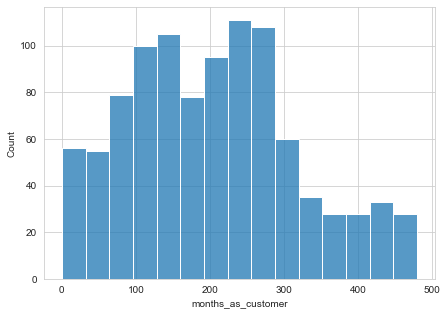

In [35]:
plt.figure(figsize=(7,5))
sns.set_style("whitegrid")
sns.histplot(data=df,x='months_as_customer')

Maximum customers are between 100 to 300 months as customer

<AxesSubplot:xlabel='age', ylabel='Count'>

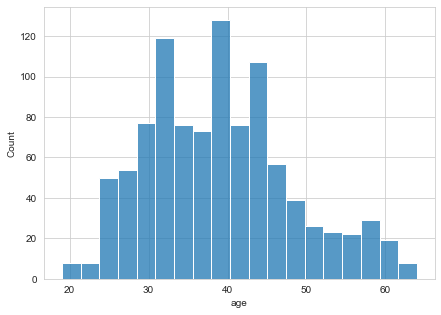

In [36]:
plt.figure(figsize=(7,5))
sns.histplot(data=df,x='age')

Maximum Age Group involved is between is around 30 to 45

OH    351
IL    338
IN    310
Name: policy_state, dtype: int64

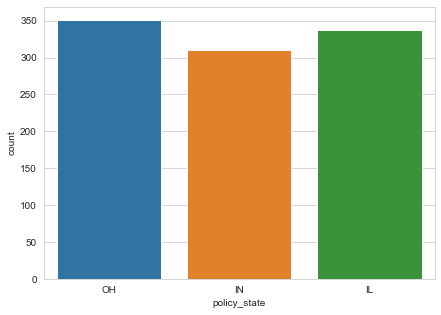

In [37]:
plt.figure(figsize=(7,5))
sns.countplot(data=df,x='policy_state')
df['policy_state'].value_counts()

Policy State (Maximum Customers is from OH)

- OH    351
- IL    338
- IN    310

250/500     351
100/300     348
500/1000    300
Name: policy_csl, dtype: int64

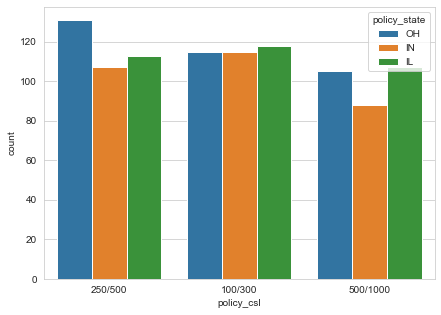

In [38]:
plt.figure(figsize=(7,5))
sns.countplot(data=df,x='policy_csl',hue='policy_state')
df['policy_csl'].value_counts()

Maximum Policy sell:
- 250/500     351
- 100/300     348
- 500/1000    300

1000    351
500     341
2000    307
Name: policy_deductable, dtype: int64

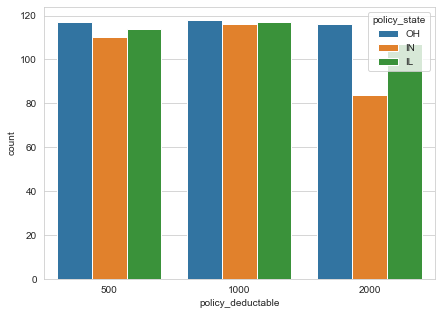

In [39]:
plt.figure(figsize=(7,5))
sns.countplot(data=df,x='policy_deductable',hue='policy_state')
df['policy_deductable'].value_counts()

Maximum Shows more demands of policy_deduction as 1000 
OH is maximum buyer of policy
- 1000    351
- 0500    341
- 2000    307

433.33 Shows Minimum And Maximum Value is 2047.59


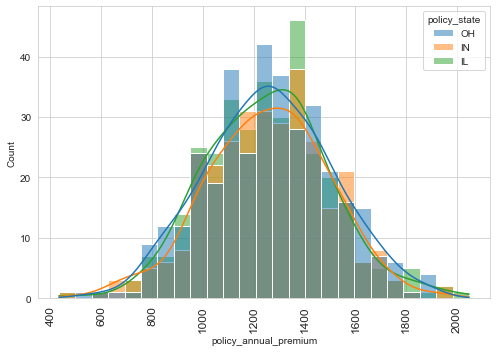

In [40]:
plt.figure(figsize=(7,5))
sns.histplot(data=df,x='policy_annual_premium',hue='policy_state',kde=True)
print(df['policy_annual_premium'].min(),"Shows Minimum And Maximum Value is",df['policy_annual_premium'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.tight_layout()

### Graph Shows :
- 433.33 Shows Minimum And Maximum Value is 2047.59
- Maximum policy_state payer is from OH
- Maximum policy_annual_premium lies between 1200 to 1400

0 Shows Minimum And Maximum is 10000000


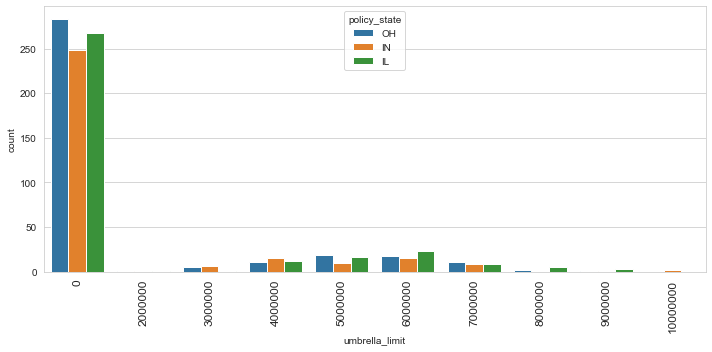

In [41]:
plt.figure(figsize=(10,5))
sns.countplot(data=df,x='umbrella_limit',hue='policy_state')
print(df['umbrella_limit'].min(),"Shows Minimum And Maximum is",df['umbrella_limit'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.tight_layout()

### Graph Shows

- Shows Maximum are with umbrella_limts zero
- Minimum umbrella_limit is O and maximum amount is 10000000

430104 Shows Minimum And Maximum is 620962


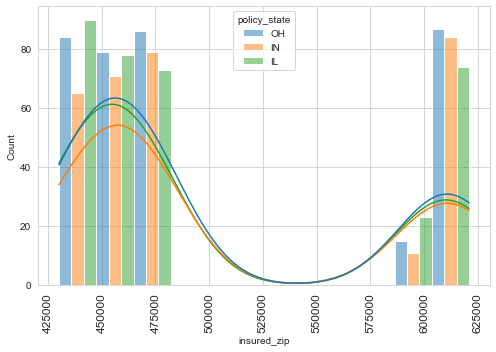

In [42]:
plt.figure(figsize=(7,5))
sns.histplot(data=df,x='insured_zip',hue='policy_state',kde=True,multiple='dodge')
print(df['insured_zip'].min(),"Shows Minimum And Maximum is",df['insured_zip'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.tight_layout()

### Graph Shows:

- Maximum insured_zip is lies 430104 to 480000
- 430104 Shows Minimum And Maximum is 620962

FEMALE    537
MALE      462
Name: insured_sex, dtype: int64

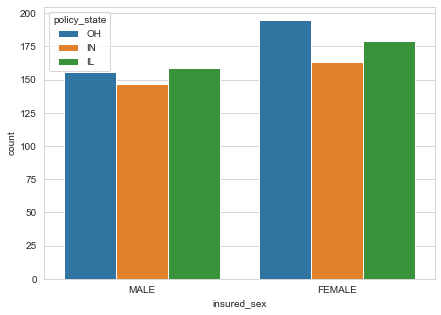

In [43]:
plt.figure(figsize=(7,5))
sns.countplot(data=df,x='insured_sex',hue='policy_state')
df['insured_sex'].value_counts()

### Graph Shows:

- Female count is 537 and Male count is 462
- Maximum Females are Insured than Male
- Maximum population is from OH

JD             161
High School    160
MD             144
Associate      144
Masters        143
PhD            125
College        122
Name: insured_education_level, dtype: int64

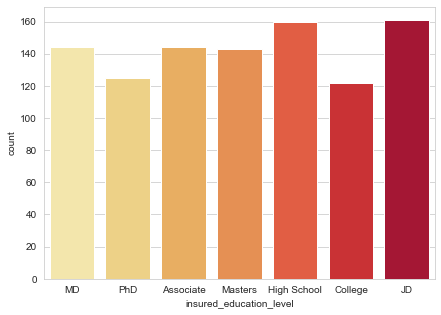

In [44]:
plt.figure(figsize=(7,5))
sns.countplot(data=df,x='insured_education_level',palette='YlOrRd')
df['insured_education_level'].value_counts()

### Graph Shows
Maximum Insured having education level are JD and High School people

JD             161
High School    160
MD             144
Associate      144
Masters        143
PhD            125
College        122

machine-op-inspct    92
prof-specialty       85
tech-support         78
sales                76
exec-managerial      76
craft-repair         74
transport-moving     72
other-service        71
priv-house-serv      71
armed-forces         69
adm-clerical         65
protective-serv      63
handlers-cleaners    54
farming-fishing      53
Name: insured_occupation, dtype: int64


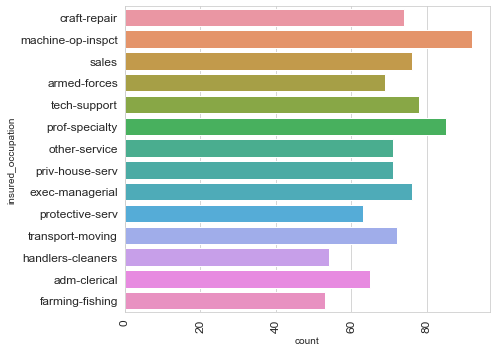

In [45]:
plt.figure(figsize=(7,5))
sns.countplot(data=df,y='insured_occupation')
print(df['insured_occupation'].value_counts())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

## Graph Show
Machine-op-inspct are insured followed by prof-specialty. counts are as follows

machine-op-inspct    92
prof-specialty       85
tech-support         78
sales                76
exec-managerial      76
craft-repair         74
transport-moving     72
other-service        71
priv-house-serv      71
armed-forces         69
adm-clerical         65
protective-serv      63
handlers-cleaners    54
farming-fishing      53

reading           64
exercise          57
paintball         57
bungie-jumping    56
movies            55
golf              55
camping           55
kayaking          53
yachting          53
hiking            52
video-games       50
skydiving         49
base-jumping      49
board-games       48
polo              47
chess             46
dancing           43
sleeping          41
cross-fit         35
basketball        34
Name: insured_hobbies, dtype: int64


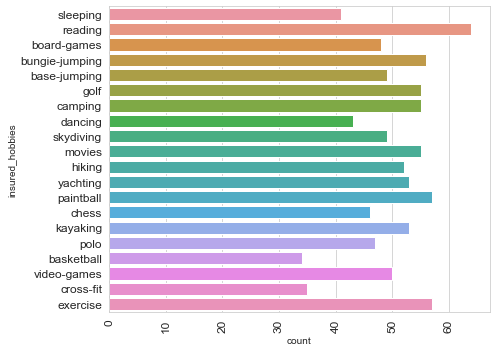

In [46]:
plt.figure(figsize=(7,5))
sns.countplot(data=df,y='insured_hobbies')
print(df['insured_hobbies'].value_counts())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

### Graph Shows:

Reading is the main habit of insured person.followed by other hobbies.

reading           64
exercise          57
paintball         57
bungie-jumping    56
movies            55
golf              55
camping           55
kayaking          53
yachting          53
hiking            52
video-games       50
skydiving         49
base-jumping      49
board-games       48
polo              47
chess             46
dancing           43
sleeping          41
cross-fit         35
basketball        34

own-child         183
other-relative    177
not-in-family     174
husband           170
wife              154
unmarried         141
Name: insured_relationship, dtype: int64


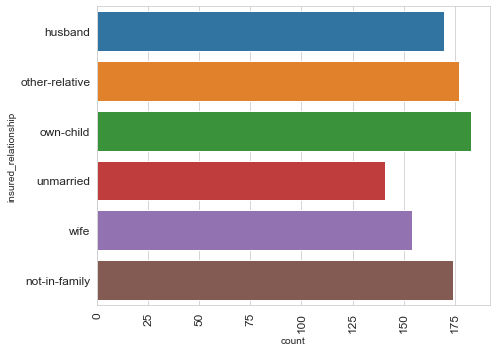

In [47]:
plt.figure(figsize=(7,5))
sns.countplot(data=df,y='insured_relationship')
print(df['insured_relationship'].value_counts())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

## Graph Shows:
Maximum Insured_relationship is Their own child.

- own-child         183
- other-relative    177
- not-in-family     174
- husband           170
- wife              154
- unmarried         141

Minimum Gains 0 Maximum Gains 100500 Total Gain 25126100


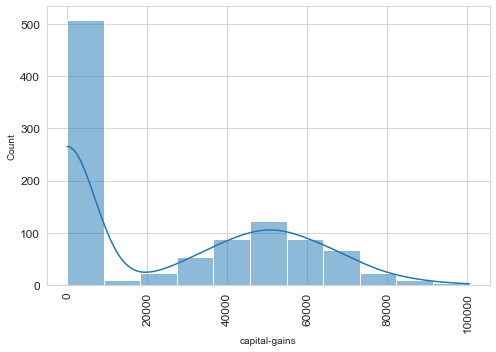

In [48]:
plt.figure(figsize=(7,5))
sns.histplot(data=df,x='capital-gains',kde=True,multiple='dodge')
print("Minimum Gains",df['capital-gains'].min(),"Maximum Gains",df['capital-gains'].max(),"Total Gain",df['capital-gains'].sum())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

## Graph Shows:

- Minimum Gains 0 Maximum Gains 100500
- Total Gain 25126100 

Maximum Loss -111100 Total Loss -26793700


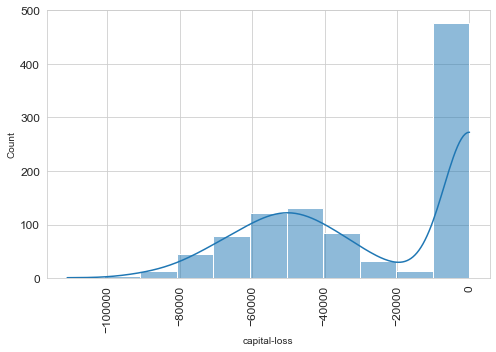

In [49]:
plt.figure(figsize=(7,5))
sns.histplot(data=df,x='capital-loss',kde=True,multiple='dodge')
print("Maximum Loss",df['capital-loss'].min(),"Total Loss",df['capital-loss'].sum())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

### Graph Shows:
- Maximum Loss -111100
- Total Loss -26793700

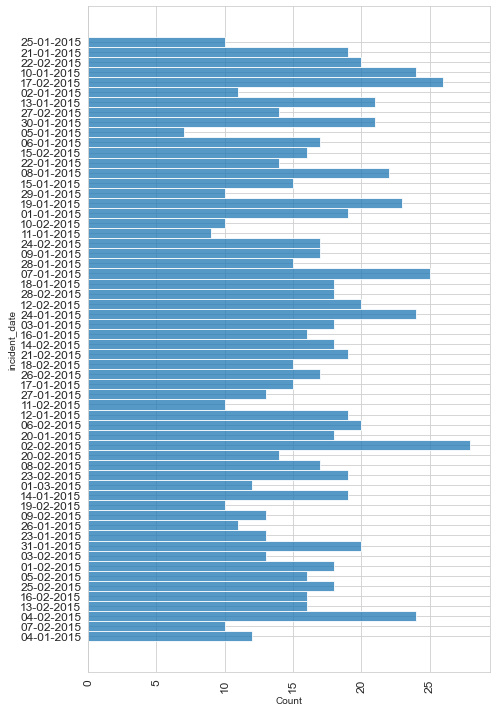

In [50]:
plt.figure(figsize=(7,10))
sns.histplot(data=df,y='incident_date')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

Maximum Incident Reported on dated 02-02-2015 followed by other dates

Multi-vehicle Collision     419
Single Vehicle Collision    402
Vehicle Theft                94
Parked Car                   84
Name: incident_type, dtype: int64


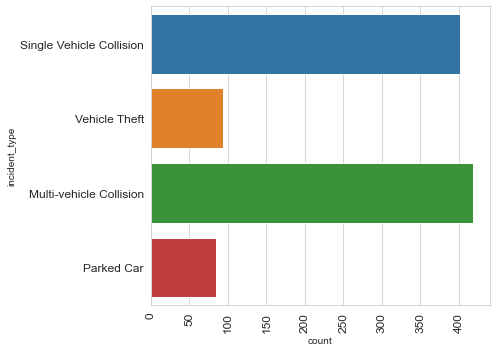

In [51]:
plt.figure(figsize=(7,5))
sns.countplot(data=df,y='incident_type')
print(df['incident_type'].value_counts())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

## Graphs Shows:

#### Maximum Shows  Vehicle Coilision
- Multi-vehicle Collision     419
- Single Vehicle Collision    402
- Vehicle Theft                94
- Parked Car                   84


Rear Collision     470
Side Collision     275
Front Collision    254
Name: collision_type, dtype: int64


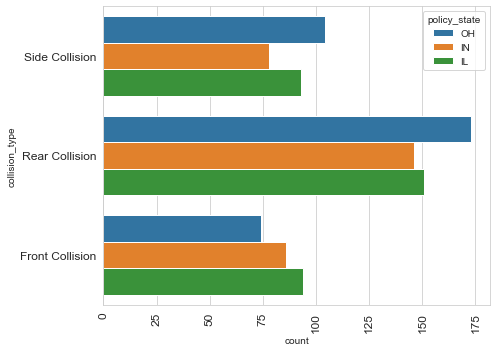

In [52]:
plt.figure(figsize=(7,5))
sns.countplot(data=df,y='collision_type',hue='policy_state')
print(df['collision_type'].value_counts())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

### Graph Shows:

Maximum collision is from rare followed by other.

- Rear Collision     470
- Side Collision     275
- Front Collision    254

Maximum  Rare and side colision from OH

Minor Damage      354
Total Loss        280
Major Damage      275
Trivial Damage     90
Name: incident_severity, dtype: int64


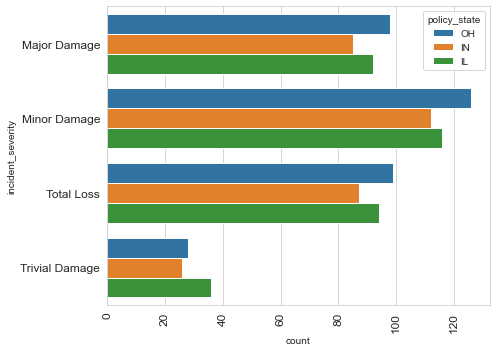

In [53]:
plt.figure(figsize=(7,5))
sns.countplot(data=df,y='incident_severity',hue='policy_state')
print(df['incident_severity'].value_counts())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

### Graph Shows:
Maximum is Minor followed by Major Maximum is from OH policy_state

- Minor Damage      354
- Total Loss        280
- Major Damage      275
- Trivial Damage     90

Police       292
Fire         223
Other        198
Ambulance    195
None          91
Name: authorities_contacted, dtype: int64


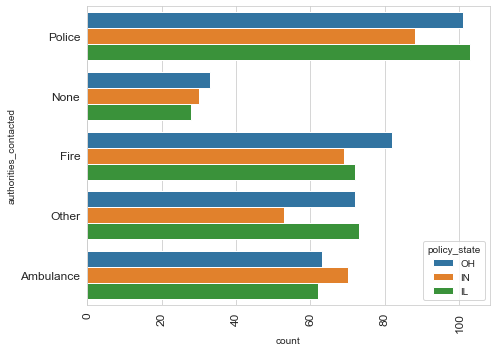

In [54]:
plt.figure(figsize=(7,5))
sns.countplot(data=df,y='authorities_contacted',hue='policy_state')
print(df['authorities_contacted'].value_counts())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

### Graph Shows

Maximum is being reported to police and Fire

Police       292
Fire         223
Other        198
Ambulance    195
None          91("Remain Un-reported")



NY    262
SC    248
WV    217
VA    110
NC    109
PA     30
OH     23
Name: incident_state, dtype: int64


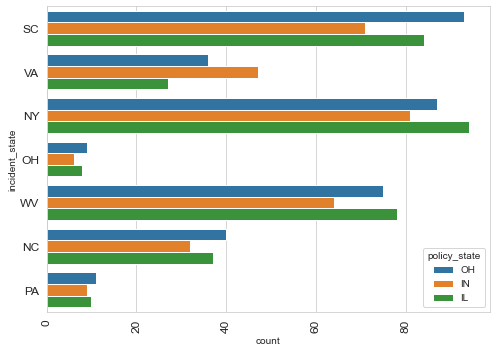

In [55]:
plt.figure(figsize=(7,5))
sns.countplot(data=df,y='incident_state',hue='policy_state')
print(df['incident_state'].value_counts())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

#### Graph Shows:

Maximum incident states is NY and SC

- NY    262
- SC    248
- WV    217
- VA    110
- NC    109
- PA     30
- OH     23

Springfield    157
Arlington      151
Columbus       149
Northbend      145
Hillsdale      141
Riverwood      134
Northbrook     122
Name: incident_city, dtype: int64


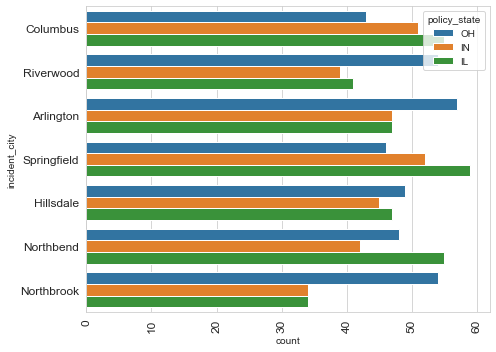

In [56]:
plt.figure(figsize=(7,5))
sns.countplot(data=df,y='incident_city',hue='policy_state')
print(df['incident_city'].value_counts())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

### Graph Shows:

Maximum incident lies with Springfield and Arlington followed by others.

Springfield    157
Arlington      151
Columbus       149
Northbend      145
Hillsdale      141
Riverwood      134
Northbrook     122

17    54
3     53
0     52
23    51
16    49
Name: incident_hour_of_the_day, dtype: int64


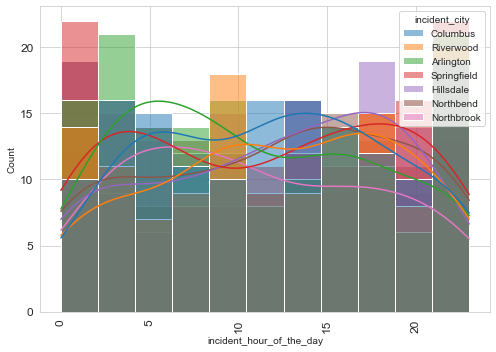

In [57]:
plt.figure(figsize=(7,5))
sns.histplot(data=df,x='incident_hour_of_the_day',hue='incident_city',kde=True)
print(df['incident_hour_of_the_day'].value_counts()[:5])
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

## Graph Shows:

Maximum Incident reported at evening time.
Top 5 incident hours

- 17    54
- 3     53
- 0     52
- 23    51
- 16    49

1    580
3    358
4     31
2     30
Name: number_of_vehicles_involved, dtype: int64


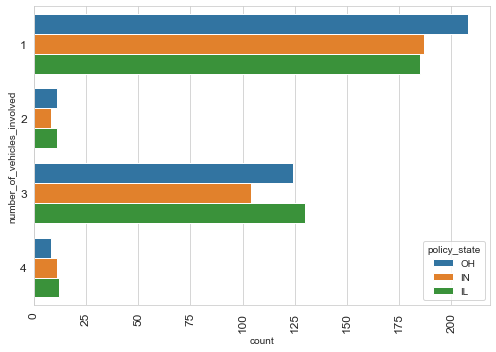

In [58]:
plt.figure(figsize=(7,5))
sns.countplot(data=df,y='number_of_vehicles_involved',hue='policy_state')
print(df['number_of_vehicles_involved'].value_counts())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

### Graph Shows:

Maximum number_of_vehicles_involved=1

- 1    580
- 3    358
- 4     31
- 2     30

NO     698
YES    301
Name: property_damage, dtype: int64


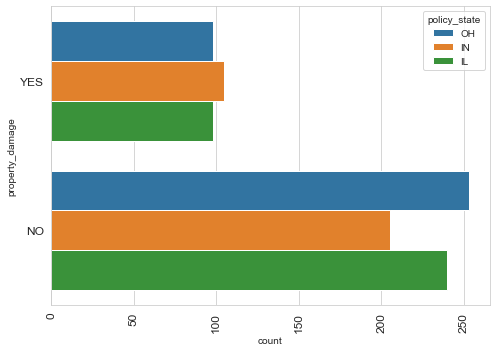

In [59]:
plt.figure(figsize=(7,5))
sns.countplot(data=df,y='property_damage',hue='policy_state')
print(df['property_damage'].value_counts())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

### Graph Shows:

Property Damage is less:
- NO     698
- YES    301

0    339
2    332
1    328
Name: bodily_injuries, dtype: int64


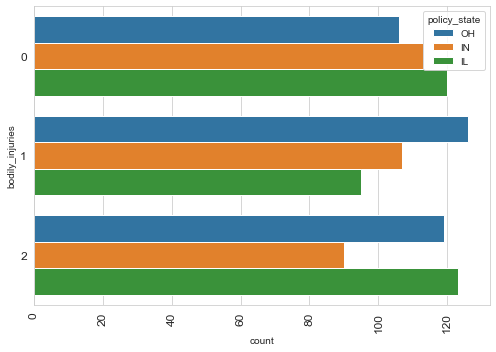

In [60]:
plt.figure(figsize=(7,5))
sns.countplot(data=df,y='bodily_injuries',hue='policy_state')
print(df['bodily_injuries'].value_counts())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

## Graph Shows: Bodily_Injuries
- 0    339(Maximum)
- 2    332
- 1    328(Minimum)

1    257
2    250
0    249
3    243
Name: witnesses, dtype: int64


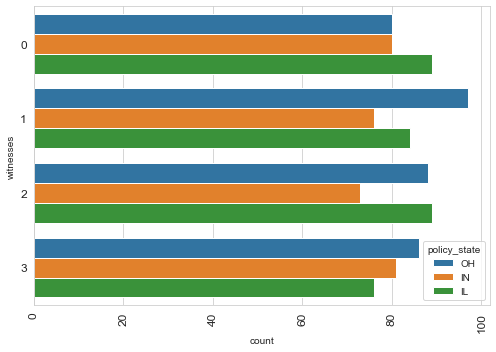

In [61]:
plt.figure(figsize=(7,5))
sns.countplot(data=df,y='witnesses',hue='policy_state')
print(df['witnesses'].value_counts())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

### Graph Shows:

Maximum having 1 witness and 3 Witness is very less. 
- 1    257
- 2    250
- 0    249
- 3    243

NO     685
YES    314
Name: police_report_available, dtype: int64


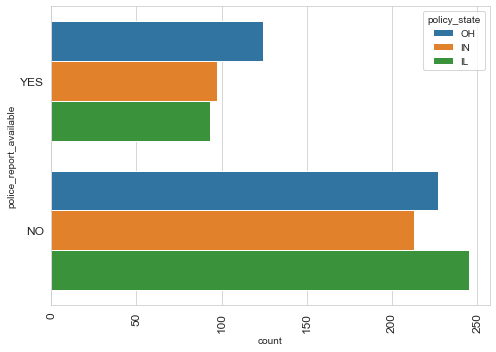

In [62]:
plt.figure(figsize=(7,5))
sns.countplot(data=df,y='police_report_available',hue='policy_state')
print(df['police_report_available'].value_counts())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

### Graph Shows

- Maximum don't report the matter to the police 
- Maximum reporting is from policy_state OH

52667780


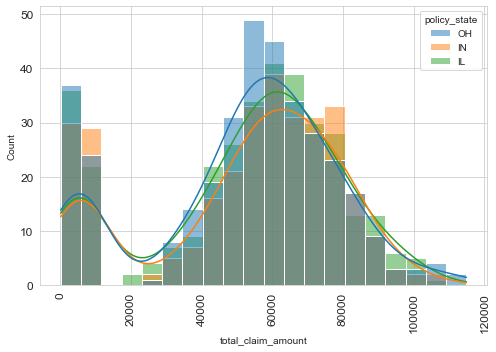

In [63]:
plt.figure(figsize=(7,5))
sns.histplot(data=df,x='total_claim_amount',hue='policy_state',kde=True)
print(df['total_claim_amount'].sum())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

### Graph Shows
- Maximum Total Claim Amount lies at 60,000
- Total Claims of 52667780

0  shows Minimum And Maximum is 21450


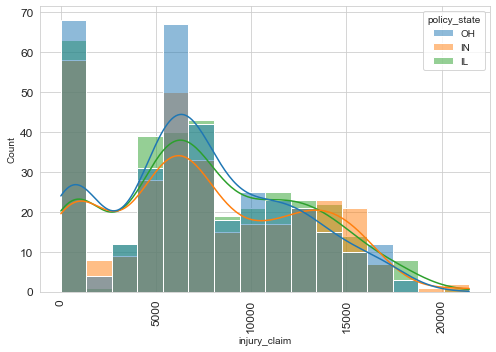

In [64]:
plt.figure(figsize=(7,5))
sns.histplot(data=df,x='injury_claim',hue='policy_state',kde=True)
print(df['injury_claim'].min()," shows Minimum And Maximum is",df['injury_claim'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

### Graph Shows
- Maximum Claims lies between 500 to 1000
- Maximum injury_claim amounts 21450

0  shows Minimum And Maximum is 23670


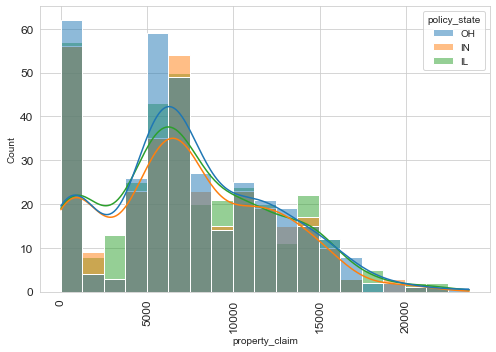

In [65]:
plt.figure(figsize=(7,5))
sns.histplot(data=df,x='property_claim',hue='policy_state',kde=True)
print(df['property_claim'].min()," shows Minimum And Maximum is",df['property_claim'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

### Graph Shows:

- Maximum property claims lies between 5000 to 8000
- 0  shows Minimum And Maximum is 23670

70  shows Minimum And Maximum is 79560


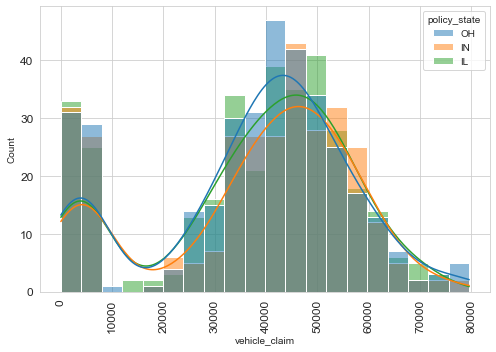

In [66]:
plt.figure(figsize=(7,5))
sns.histplot(data=df,x='vehicle_claim',hue='policy_state',kde=True)
print(df['vehicle_claim'].min()," shows Minimum And Maximum is",df['vehicle_claim'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

### Graph Shows

- Maximum Vehicle_claim lies between 40000 to 50,000 
- Vehicle_claim Shows 70 as Minimum And Maximum is 79560

Saab          80
Dodge         80
Suburu        80
Nissan        78
Chevrolet     75
Ford          72
BMW           72
Toyota        70
Audi          69
Accura        68
Volkswagen    68
Jeep          67
Mercedes      65
Honda         55
Name: auto_make, dtype: int64


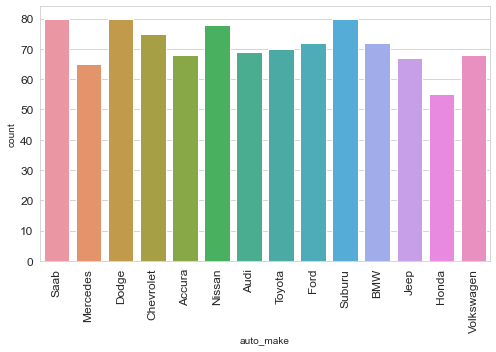

In [67]:
plt.figure(figsize=(7,5))
sns.countplot(data=df,x='auto_make')
print(df['auto_make'].value_counts())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

### Graph Shows:

claims for various items counts

- Saab          80
- Dodge         80
- Suburu        80
- Nissan        78
- Chevrolet     75
- Ford          72
- BMW           72
- Toyota        70
- Audi          69
- Accura        68
- Volkswagen    68
- Jeep          67
- Mercedes      65
- Honda         55

RAM         43
Wrangler    42
A3          37
Neon        37
MDX         36
Name: auto_model, dtype: int64


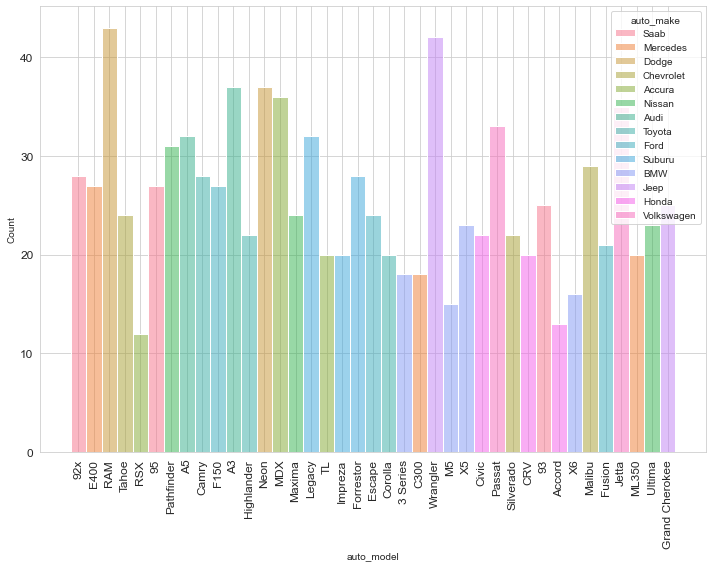

In [68]:
plt.figure(figsize=(10,8))
sns.histplot(data=df,x='auto_model',hue='auto_make')
print(df['auto_model'].value_counts()[:5])
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

### Graph Shows

Top 5 auto model

- RAM         43
- Wrangler    42
- A3          37
- Neon        37
- MDX         36

1995    56
1999    55
2005    54
2006    53
2011    53
2007    52
2003    51
2009    50
2010    50
2013    49
2002    49
2015    47
1997    46
2012    46
2008    45
2014    44
2001    42
2000    42
1998    40
2004    39
1996    36
Name: auto_year, dtype: int64


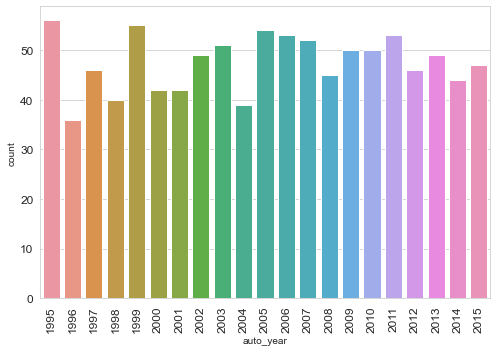

In [69]:
plt.figure(figsize=(7,5))
sns.countplot(data=df,x='auto_year')
print(df['auto_year'].value_counts())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

#### Graph shows  
Maximum at 1995 and 1996 followed by others

1995    56,
1999    55,
2005    54,
2006    53,
2011    53,
2007    52,
2003    51,
2009    50,
2010    50,
2013    49
2002    49
2015    47
1997    46
2012    46
2008    45
2014    44
2001    42
2000    42
1998    40
2004    39
1996    36

N    752
Y    247
Name: fraud_reported, dtype: int64


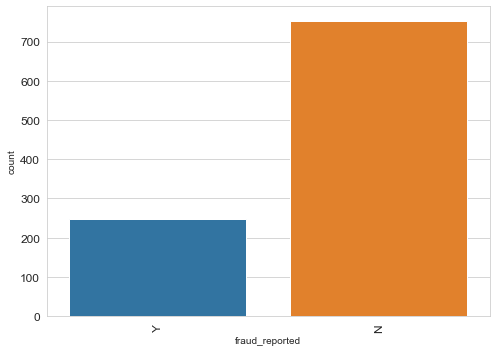

In [70]:
plt.figure(figsize=(7,5))
sns.countplot(data=df,x='fraud_reported')
print(df['fraud_reported'].value_counts())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

### Graph Shows

Fraud reported is very less.
- N    752
- Y    247

# Bi-Variate Analysis

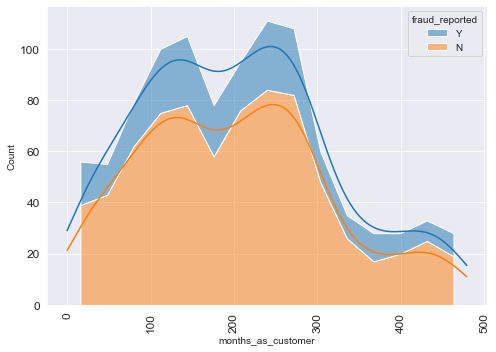

In [71]:
plt.figure(figsize=(7,5))
sns.set_style("darkgrid")
sns.histplot(data=df,hue='fraud_reported',x='months_as_customer',multiple='stack',kde=True,element='poly')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

### Graph Shows

Fraud count is high between 200 to 300 followed by 100 to 180

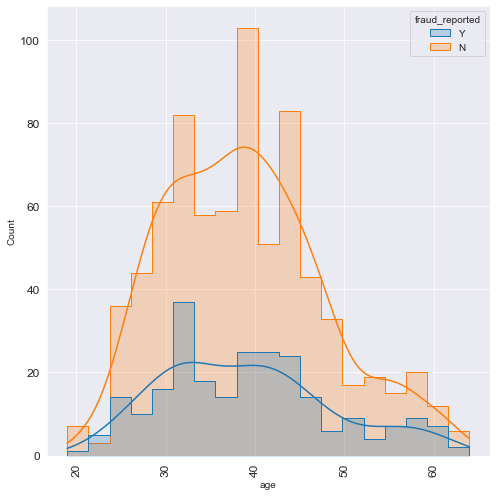

In [72]:
plt.figure(figsize=(7,7))
sns.set_style("darkgrid")
sns.histplot(data=df,hue='fraud_reported',x='age',kde=True,element='step')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

### Graph Shows

- fraud reports are high for the age range group 30 to 35

<AxesSubplot:xlabel='policy_state', ylabel='count'>

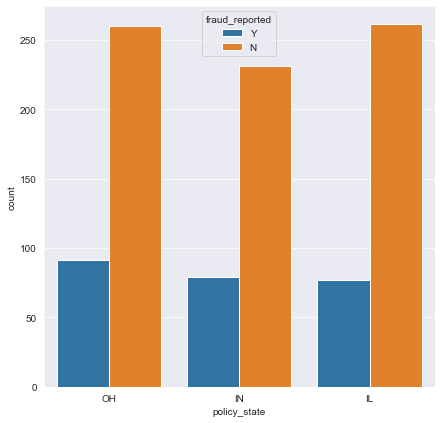

In [73]:
plt.figure(figsize=(7,7))
sns.set_style("darkgrid")
sns.countplot(data=df,hue='fraud_reported',x='policy_state',dodge=True)

## Graph Shows

- policy state shows Highest fraud is on OH, followed by IN and L

<AxesSubplot:xlabel='policy_csl', ylabel='count'>

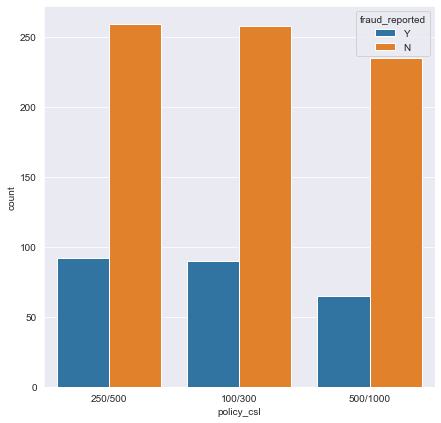

In [74]:
plt.figure(figsize=(7,7))
sns.set_style("darkgrid")
sns.countplot(data=df,x='policy_csl',hue='fraud_reported')

### Graph Shows.

Maximum policy_csl fraud is 250/500 and 100/300

<AxesSubplot:xlabel='policy_deductable', ylabel='count'>

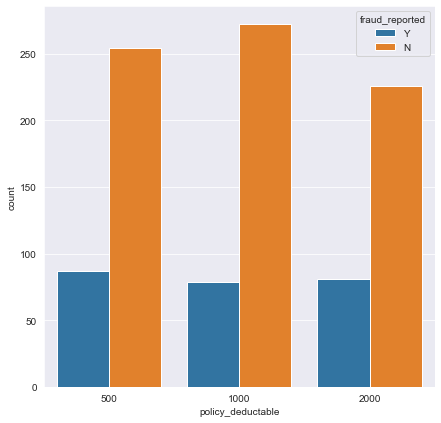

In [75]:
plt.figure(figsize=(7,7))
sns.set_style("darkgrid")
sns.countplot(data=df,hue='fraud_reported',x='policy_deductable')

Lowest policy_deductable is having highest report of fraud

<Figure size 504x504 with 0 Axes>

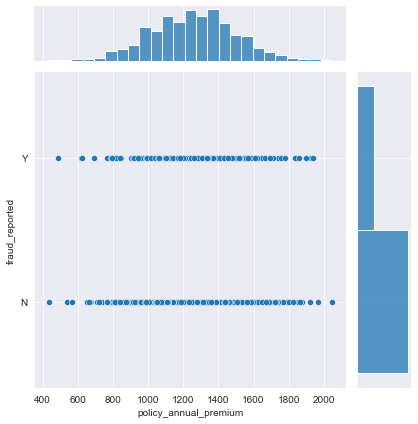

In [76]:
plt.figure(figsize=(7,7))
sns.set_style("darkgrid")
sns.jointplot(data=df,y='fraud_reported',x='policy_annual_premium')

<Figure size 504x504 with 0 Axes>

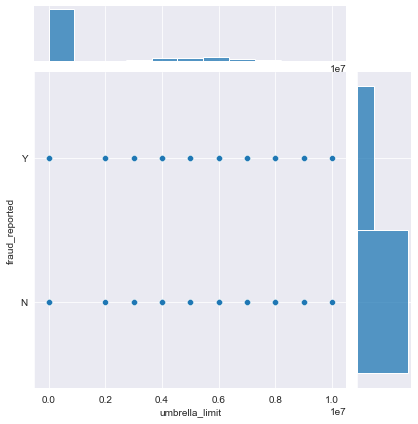

In [77]:
plt.figure(figsize=(7,7))
sns.set_style("darkgrid")
sns.jointplot(data=df,y='fraud_reported',x='umbrella_limit')

<AxesSubplot:xlabel='insured_zip', ylabel='Count'>

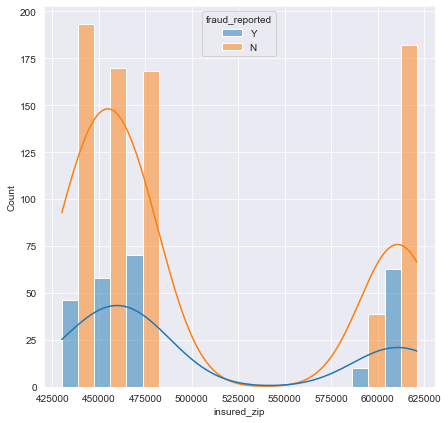

In [78]:
plt.figure(figsize=(7,7))
sns.set_style("darkgrid")
sns.histplot(data=df,hue='fraud_reported',x='insured_zip',stat='count',multiple='dodge',kde=True)

### Graph Shows

- Maximum fraud reported in insured_zip is between 450000 to 475000 and 600000 to 625000

<AxesSubplot:xlabel='insured_sex', ylabel='Count'>

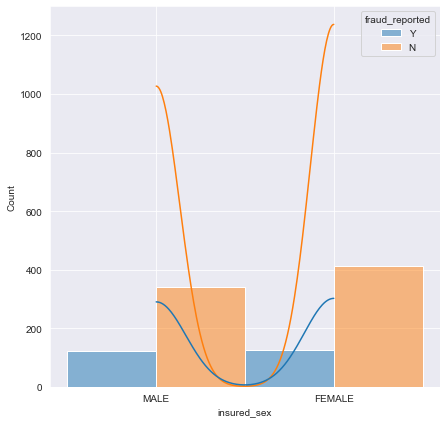

In [79]:
plt.figure(figsize=(7,7))
sns.set_style("darkgrid")
sns.histplot(data=df,hue='fraud_reported',x='insured_sex',stat='count',multiple='dodge',kde=True,element='bars')

Both the Insured_sex is envolved the same for fraud

<AxesSubplot:xlabel='insured_education_level', ylabel='count'>

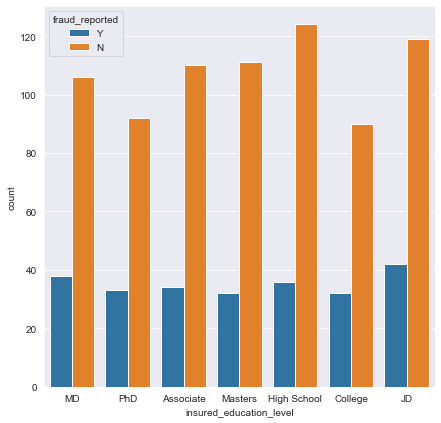

In [80]:
plt.figure(figsize=(7,7))
sns.set_style("darkgrid")
sns.countplot(data=df,hue='fraud_reported',x='insured_education_level')

### Graph Shows.

- JD, MD and High School Shows Maximum frauds

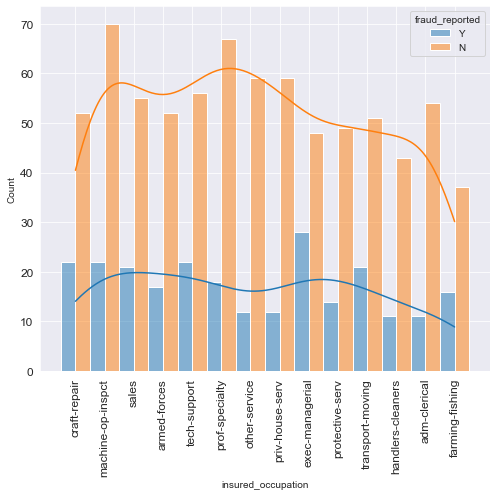

In [81]:
plt.figure(figsize=(7,7))
sns.set_style("darkgrid")
sns.histplot(data=df,hue='fraud_reported',x='insured_occupation',stat='count',multiple='dodge',kde=True,element='bars')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

### Graph Shows.
- Exec-Managerial and tech Support shows Maximum Fraud fallowed by others 

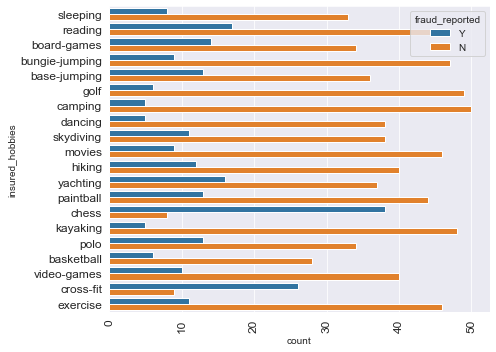

In [82]:
plt.figure(figsize=(7,5))
sns.set_style("darkgrid")
sns.countplot(data=df,hue='fraud_reported',y='insured_hobbies')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

#### Graph Shows.
- Chess players,reading  and Cross Fit hobbies are involved in fraud

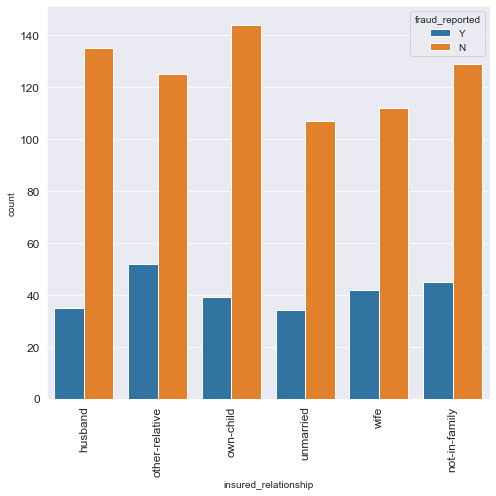

In [83]:
plt.figure(figsize=(7,7))
sns.set_style("darkgrid")
sns.countplot(data=df,hue='fraud_reported',x='insured_relationship')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

### Graph Shows.
- other-relative and not in family are involved in having maximum fraud 

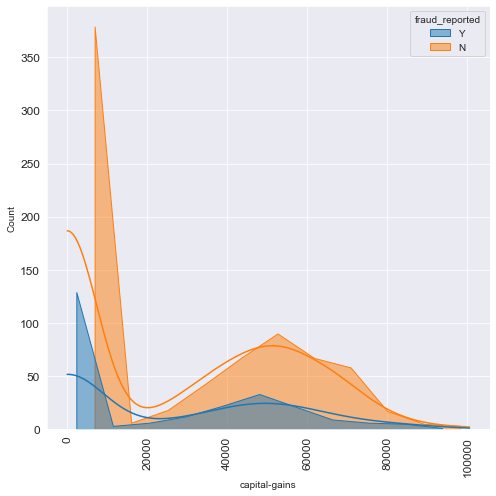

In [84]:
plt.figure(figsize=(7,7))
sns.set_style("darkgrid")
sns.histplot(data=df,hue='fraud_reported',x='capital-gains',stat='count',multiple='dodge',kde=True,element='poly')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

### Graph Shows.

- graph shows maximum fraud less than 150000 followed by 40,000 to 50,000

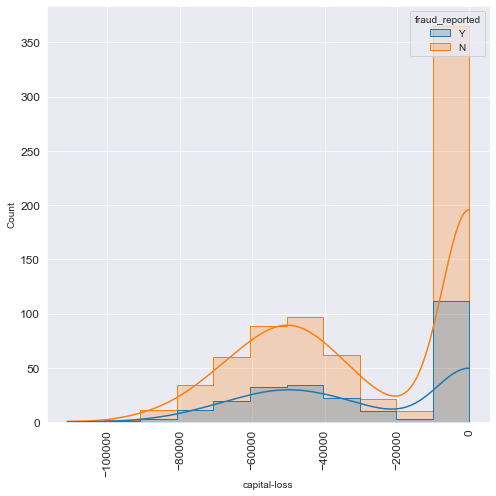

In [85]:
plt.figure(figsize=(7,7))
sns.set_style("darkgrid")
sns.histplot(data=df,hue='fraud_reported',x='capital-loss',stat='count',multiple='layer',kde=True,element='step')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

### Graph Shows.

- Maximum fraud in capital loss less than o to 10000, frauds are more 40000 to 60000

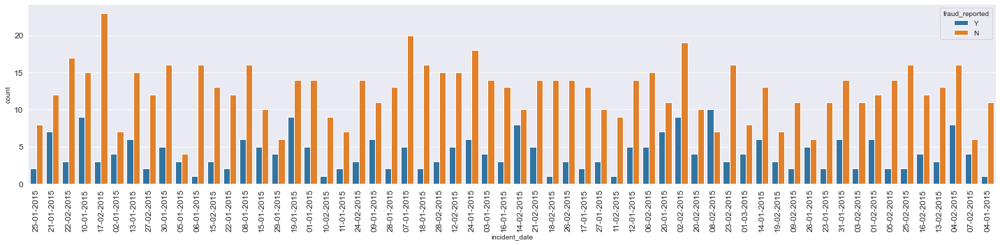

In [86]:
plt.figure(figsize=(20,5))
sns.set_style("darkgrid")
sns.countplot(data=df,hue='fraud_reported',x='incident_date')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

Maximum fraud is recorded in the month of close to Febrarury or february

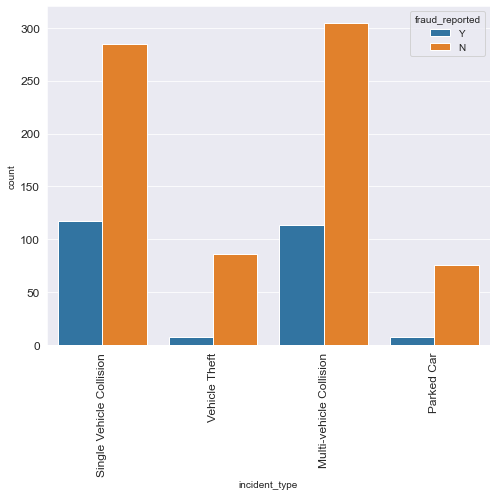

In [87]:
plt.figure(figsize=(7,7))
sns.set_style("darkgrid")
sns.countplot(data=df,hue='fraud_reported',x='incident_type')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

Maximum fraud is for Single vehicle or Multi vehicle collision

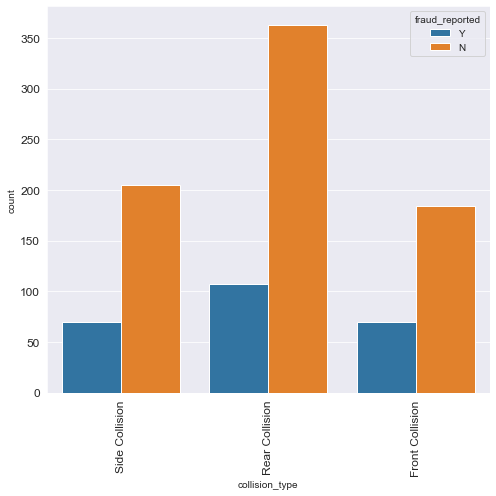

In [88]:
plt.figure(figsize=(7,7))
sns.set_style("darkgrid")
sns.countplot(data=df,hue='fraud_reported',x='collision_type')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

### Graph Shows

- Maximum Fraud reports are from Rear Collision 

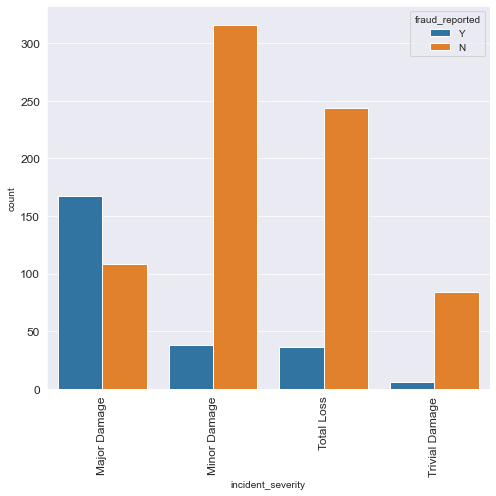

In [89]:
plt.figure(figsize=(7,7))
sns.set_style("darkgrid")
sns.countplot(data=df,hue='fraud_reported',x='incident_severity')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

### Graph Shows

- Major Damage fraud is on higher Side

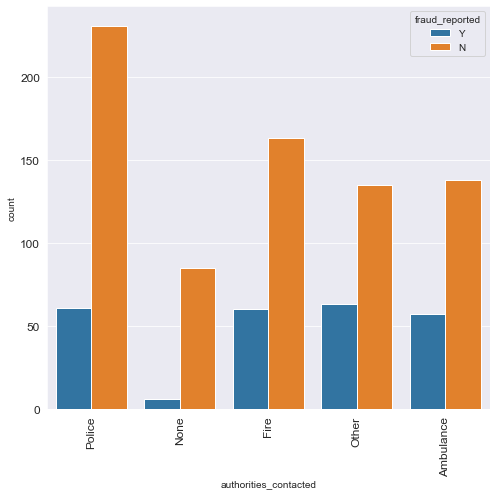

In [90]:
plt.figure(figsize=(7,7))
sns.set_style("darkgrid")
sns.countplot(data=df,hue='fraud_reported',x='authorities_contacted')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

# Grah Shows.
- Authorities Contracted Shows Maximum fraud cases happens in Police, Fire and Other and Ambulance having fraud is more.

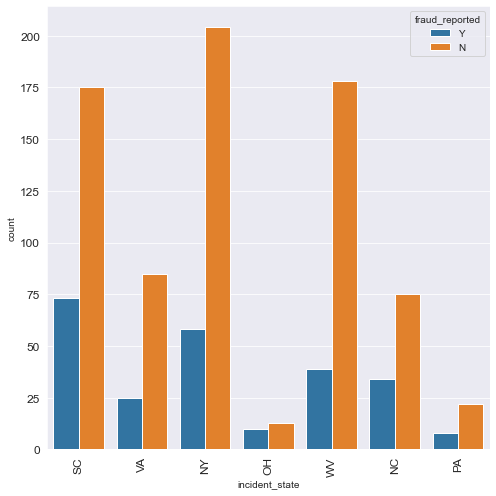

In [91]:
plt.figure(figsize=(7,7))
sns.set_style("darkgrid")
sns.countplot(data=df,hue='fraud_reported',x='incident_state')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

### Graph Shows
- SC and NY shows Highest Fraud

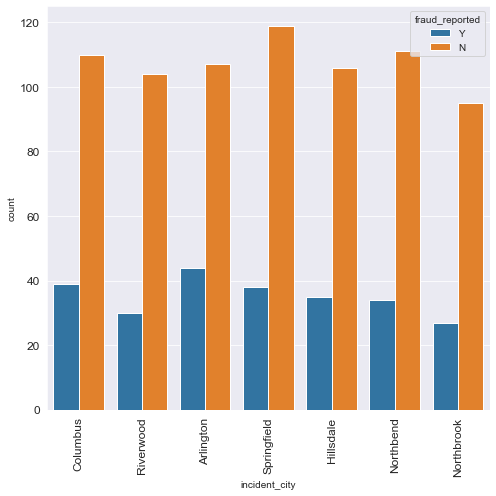

In [92]:
plt.figure(figsize=(7,7))
sns.set_style("darkgrid")
sns.countplot(data=df,hue='fraud_reported',x='incident_city')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

### Graph Shows.

Maximum Farud is with Arlington followed by others

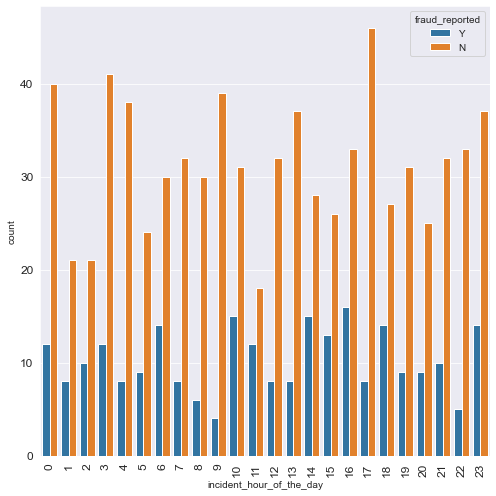

In [93]:
plt.figure(figsize=(7,7))
sns.set_style("darkgrid")
sns.countplot(data=df,hue='fraud_reported',x='incident_hour_of_the_day')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

### Graph Shows

- Maximum reported at Evening

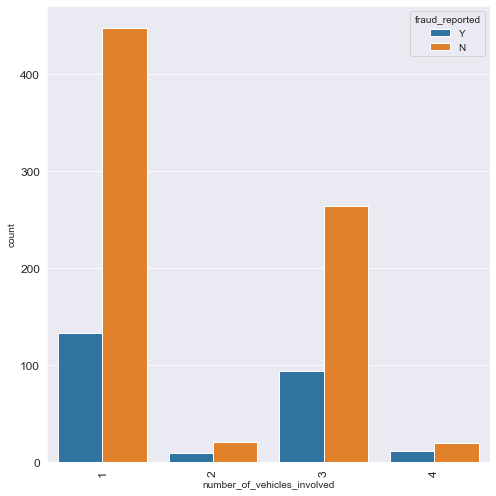

In [94]:
plt.figure(figsize=(7,7))
sns.set_style("darkgrid")
sns.countplot(data=df,hue='fraud_reported',x='number_of_vehicles_involved')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

Maximum Farud is with number of vehicles is 1 and 3 followed by others

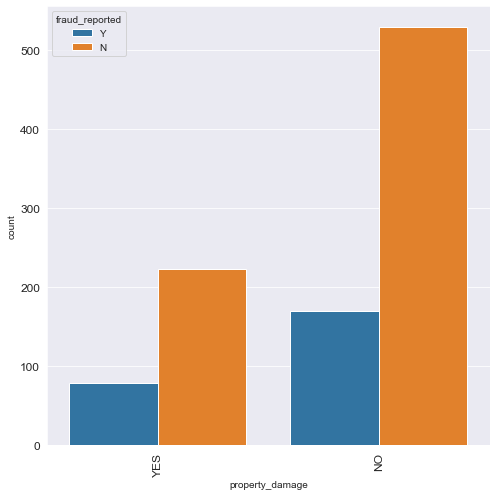

In [95]:
plt.figure(figsize=(7,7))
sns.set_style("darkgrid")
sns.countplot(data=df,hue='fraud_reported',x='property_damage')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

### Graph Shows
- No column shows maximum fraud in property

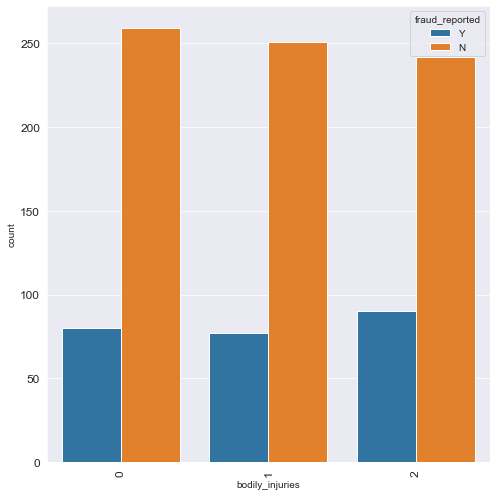

In [96]:
plt.figure(figsize=(7,7))
sns.set_style("darkgrid")
sns.countplot(data=df,hue='fraud_reported',x='bodily_injuries')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

### Graph Shows

- Bodily injuries columns shows maximum is by 2 followed by 0 and 1

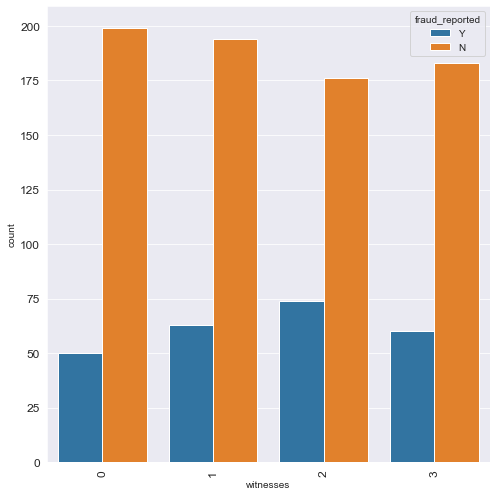

In [97]:
plt.figure(figsize=(7,7))
sns.set_style("darkgrid")
sns.countplot(data=df,hue='fraud_reported',x='witnesses')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

## graph Shows

- Maximum Fraud is by 2

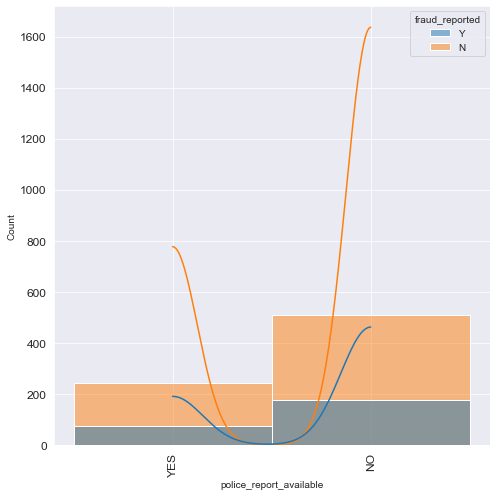

In [98]:
plt.figure(figsize=(7,7))
sns.set_style("darkgrid")
sns.histplot(data=df,hue='fraud_reported',x='police_report_available',stat='count',multiple='layer',kde=True)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

### Graph Shows

- Column Maximum people Non reporting case is fraud

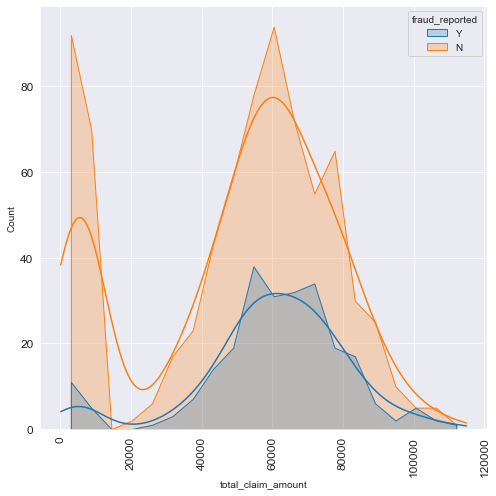

In [99]:
plt.figure(figsize=(7,7))
sns.set_style("darkgrid")
sns.histplot(data=df,hue='fraud_reported',x='total_claim_amount',stat='count',multiple='layer',kde=True,element='poly')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

Maximum fraud happens in amount between 4000 to 80000

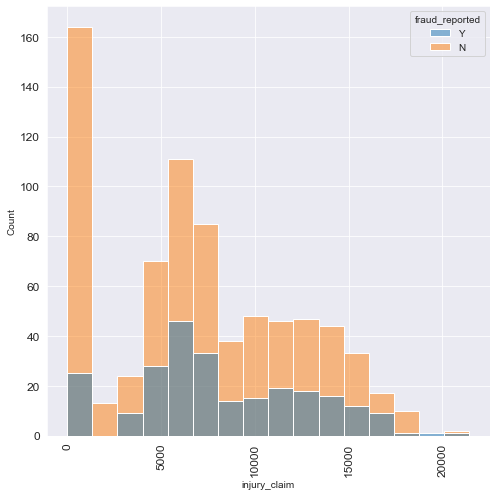

In [100]:
plt.figure(figsize=(7,7))
sns.set_style("darkgrid")
sns.histplot(data=df,hue='fraud_reported',x='injury_claim')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

### Graph Shows
- Maximum fraud is between 5000 to 8000

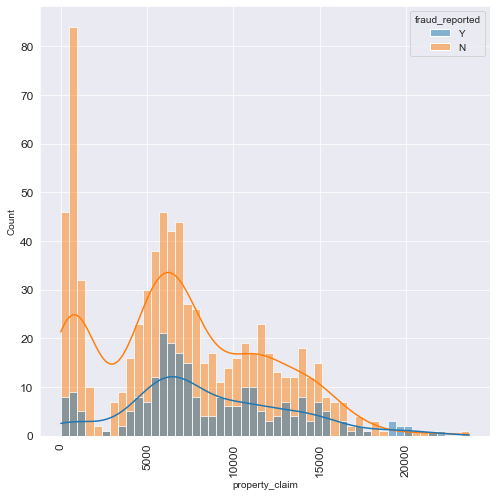

In [101]:
plt.figure(figsize=(7,7))
sns.set_style("darkgrid")
sns.histplot(data=df,hue='fraud_reported',x='property_claim',bins=50,kde=True)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

### Graph Shows
- Maximum fraud is between 5000 to 10000

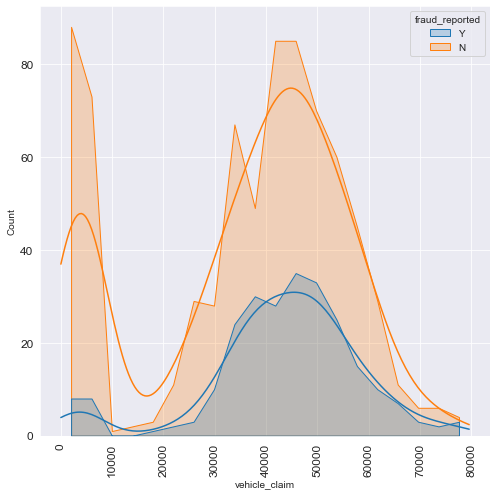

In [102]:
plt.figure(figsize=(7,7))
sns.set_style("darkgrid")
sns.histplot(data=df,hue='fraud_reported',x='vehicle_claim',stat='count',multiple='layer',kde=True,element='poly')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

### Graph Shows
- Maximum Farud is between 40000 to 52000

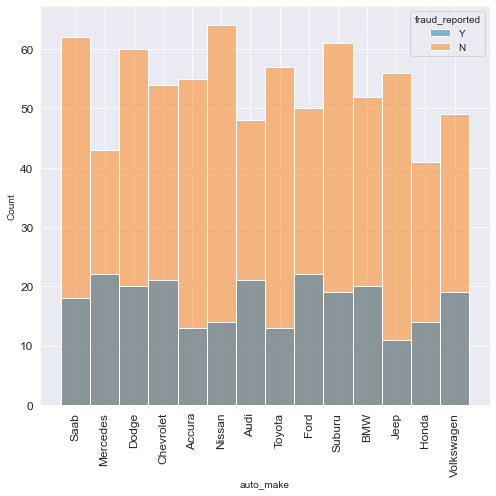

In [103]:
plt.figure(figsize=(7,7))
sns.set_style("darkgrid")
sns.histplot(data=df,hue='fraud_reported',x='auto_make',stat='count')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

Maximum Fraud is by Mercedes and others

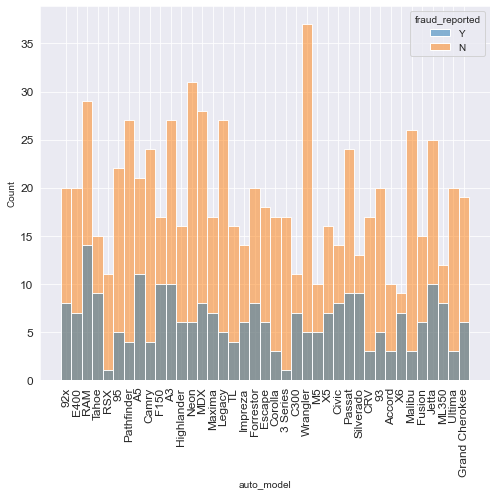

In [104]:
plt.figure(figsize=(7,7))
sns.set_style("darkgrid")
sns.histplot(data=df,hue='fraud_reported',x='auto_model')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

RAM model is reported with highest fraud followed by others

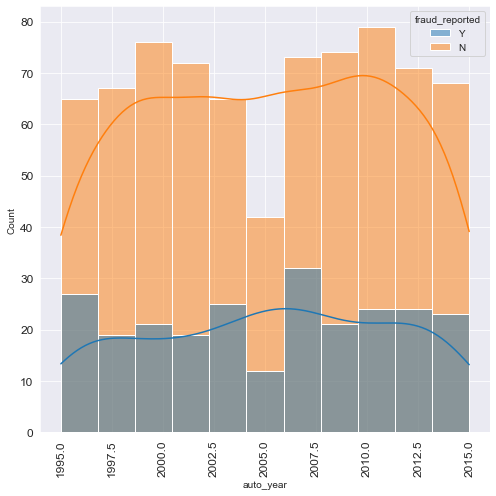

In [105]:
plt.figure(figsize=(7,7))
sns.set_style("darkgrid")
sns.histplot(data=df,hue='fraud_reported',x='auto_year',multiple='layer',kde=True,stat='count')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

### Graph Shows

- Auto year shows Maximum Fraud is by 2005

# Multi-Variate Analysis

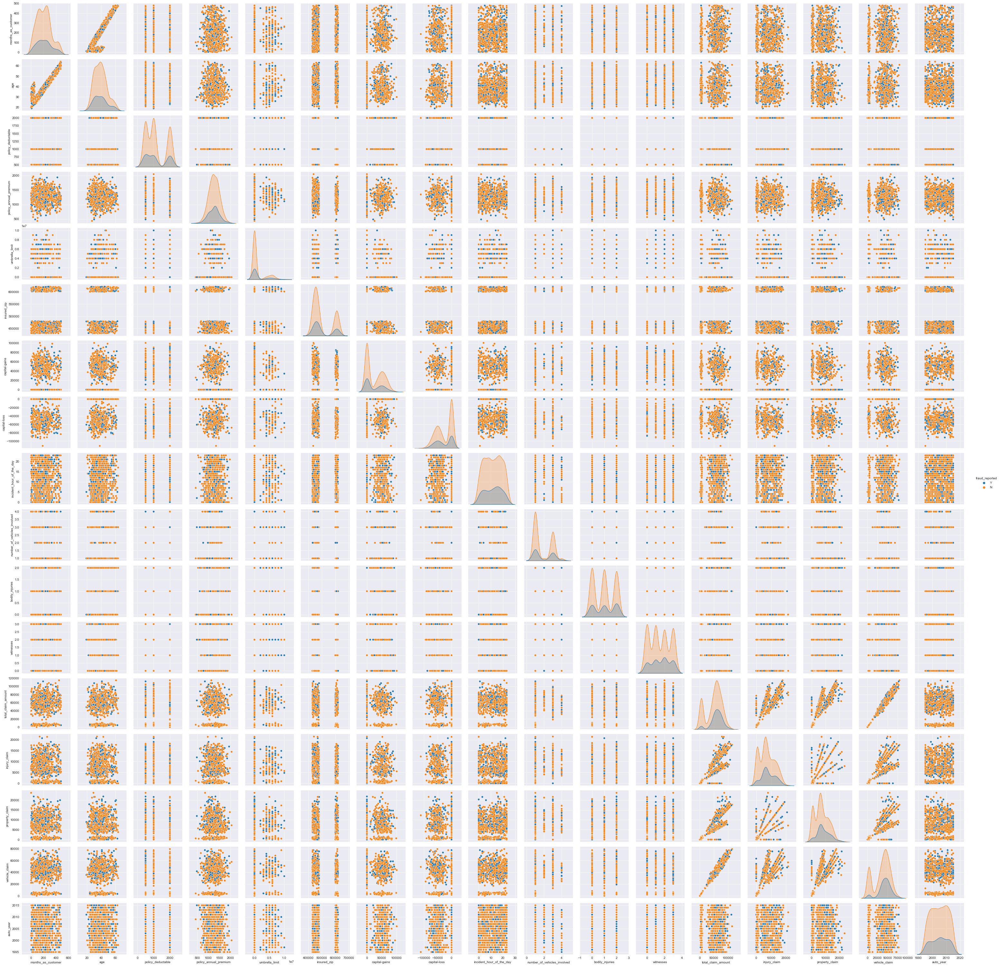

In [106]:
sns.pairplot(df,hue='fraud_reported')

In [107]:
df.head(4)

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,Rear Collision,Minor Damage,Police,VA,Riverwood,8,1,NO,0,0,NO,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,5,1,NO,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y


In [108]:
df.drop(['incident_date'],axis=1,inplace=True)

# Label Encoder

In [109]:
from sklearn.preprocessing import LabelEncoder
le= LabelEncoder()

for i in df.columns:
    if df[i].dtype=='object':
        df[i]=le.fit_transform(df[i])

In [110]:
df.head(4)

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,2,1,1000,1406.91,0,466132,1,4,2,17,0,53300,0,2,2,0,4,4,1,5,1,1,1,2,1,71610,6510,13020,52080,10,1,2004,1
1,228,42,1,1,2000,1197.22,5000000,468176,1,4,6,15,2,0,0,3,1,1,4,5,5,8,1,0,0,0,0,5070,780,780,3510,8,12,2007,1
2,134,29,2,0,2000,1413.14,5000000,430632,0,6,11,2,3,35100,0,0,1,1,4,1,1,7,3,0,2,3,0,34650,7700,3850,23100,4,30,2007,0
3,256,41,0,1,2000,1415.74,6000000,608117,0,6,1,2,4,48900,-62400,2,0,0,4,2,0,5,1,0,1,2,0,63400,6340,6340,50720,3,34,2014,1


# Descriptive Statistics

In [111]:
df.describe(include='all')

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
count,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,9.990000e+02,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000
mean,203.873874,38.944945,1.013013,0.951952,1136.636637,1256.323934,1.103103e+06,501277.587588,0.462462,2.968969,6.653654,9.729730,2.413413,25151.251251,-26820.520521,1.171171,1.021021,1.185185,2.169169,3.245245,2.968969,11.642643,1.839840,0.301301,0.992993,1.487487,0.314314,52720.500501,7432.292292,7389.839840,37898.368368,6.549550,19.312312,2005.112112,0.247247
std,115.142928,9.144354,0.830790,0.804355,611.839681,244.275843,2.297594e+06,71709.740537,0.498839,1.947209,4.021007,5.676749,1.679852,27874.792269,28105.366259,1.081698,0.727748,0.939418,1.531372,2.154576,2.043132,6.954722,1.019044,0.459053,0.819936,1.111785,0.464475,26382.199299,4883.266266,4817.316312,18870.924206,4.035327,11.140232,6.011966,0.431628
min,0.000000,19.000000,0.000000,0.000000,500.000000,433.330000,0.000000e+00,430104.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-111100.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,100.000000,0.000000,0.000000,70.000000,0.000000,0.000000,1995.000000,0.000000
25%,115.500000,32.000000,0.000000,0.000000,500.000000,1089.185000,0.000000e+00,448451.000000,0.000000,1.000000,3.000000,5.000000,1.000000,0.000000,-51500.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,6.000000,1.000000,0.000000,0.000000,1.000000,0.000000,41775.000000,4290.000000,4440.000000,30275.000000,3.000000,10.000000,2000.000000,0.000000
50%,199.000000,38.000000,1.000000,1.000000,1000.000000,1257.040000,0.000000e+00,466498.000000,0.000000,3.000000,7.000000,10.000000,2.000000,0.000000,-24100.000000,1.000000,1.000000,1.000000,2.000000,4.000000,3.000000,12.000000,1.000000,0.000000,1.000000,1.000000,0.000000,57970.000000,6770.000000,6750.000000,42080.000000,7.000000,20.000000,2005.000000,0.000000
75%,276.000000,44.000000,2.000000,2.000000,2000.000000,1415.710000,0.000000e+00,603254.000000,1.000000,5.000000,10.000000,15.000000,4.000000,51050.000000,0.000000,2.000000,2.000000,2.000000,4.000000,5.000000,5.000000,17.000000,3.000000,1.000000,2.000000,2.000000,1.000000,70550.000000,11310.000000,10870.000000,50775.000000,10.000000,29.000000,2010.000000,0.000000
max,479.000000,64.000000,2.000000,2.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,1.000000,6.000000,13.000000,19.000000,5.000000,100500.000000,0.000000,3.000000,2.000000,3.000000,4.000000,6.000000,6.000000,23.000000,4.000000,1.000000,2.000000,3.000000,1.000000,114920.000000,21450.000000,23670.000000,79560.000000,13.000000,38.000000,2015.000000,1.000000


## Descriptive Map

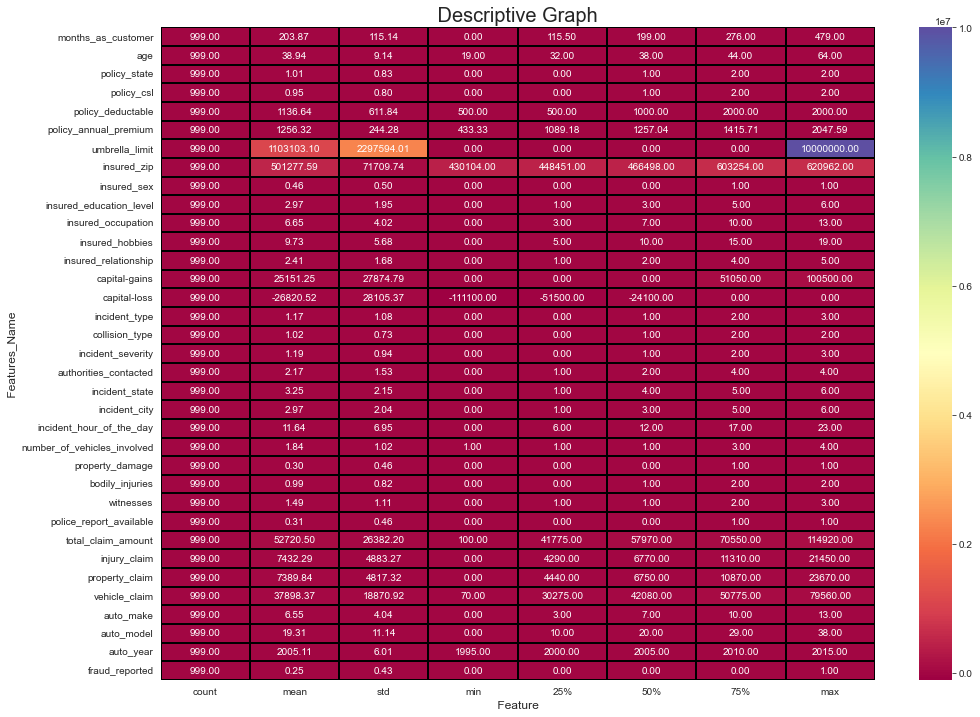

In [112]:
plt.figure(figsize=(16,12))
sns.heatmap(data=df.describe().T,annot=True,fmt='0.2f',linecolor='black',linewidth=0.02,cmap='Spectral')
plt.xlabel(" Feature ", fontsize=12)
plt.ylabel(" Features_Name ",fontsize=12)
plt.title(" Descriptive Graph ",fontsize=20)
plt.show()

### Few Observations:

- Null Values : No Null Values.

- Right Skewd : policy_deductable,  insured_zip,capital-loss, injury_claim, property_claim
-  Left Skewd : total_claim_amount, vehicle_claim
-    High STD : months_as_customer, policy_csl,policy_deductable,capital-gains,capital-loss,total_claim_amount,injury_claim	property_claim, vehicle_claim,
-    Outliers : total_claim_amount, injury_claim, property_claim,capital-gains

# Correlation Graph

In [113]:
df.corr()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
months_as_customer,1.000000,0.922141,-0.001156,-0.026020,0.027553,0.004785,0.016146,0.018519,0.060225,0.000228,0.009930,-0.093842,0.068754,0.007032,0.019559,-0.017920,-0.073808,-0.058764,0.011020,0.006426,0.000882,0.070522,0.015319,0.004435,-0.009328,0.058708,-0.021685,0.061106,0.065185,0.033613,0.059979,0.048298,0.003848,0.000763,0.020951
age,0.922141,1.000000,-0.014942,-0.014800,0.029553,0.014293,0.018441,0.025910,0.073024,0.001480,0.017276,-0.081397,0.074410,-0.006777,0.007052,-0.025891,-0.076164,-0.058066,0.015907,0.006280,-0.001808,0.087103,0.022386,-0.003921,-0.015286,0.052513,-0.020221,0.069427,0.075451,0.060350,0.062131,0.030718,0.017176,0.001862,0.012338
policy_state,-0.001156,-0.014942,1.000000,0.002436,0.011283,0.012065,-0.028525,0.009833,-0.021789,-0.032578,-0.031044,-0.038984,-0.020372,0.075707,-0.031508,0.030969,0.050923,-0.024917,-0.015121,0.010530,-0.000352,0.029246,-0.041327,-0.010291,0.014844,0.023500,0.069886,-0.007882,-0.046598,0.006027,-0.000499,0.018189,-0.025882,0.003921,0.030138
policy_csl,-0.026020,-0.014800,0.002436,1.000000,0.002155,0.024395,0.020575,0.005844,-0.009494,0.007364,0.015606,-0.005700,-0.028295,0.004186,-0.033521,0.012917,0.022268,0.021070,0.054600,0.031090,0.007628,-0.001640,-0.020400,-0.025882,-0.002030,0.071037,-0.002448,-0.054005,-0.078602,-0.039939,-0.044966,-0.005749,0.048530,-0.034939,-0.037901
policy_deductable,0.027553,0.029553,0.011283,0.002155,1.000000,-0.002897,0.009927,0.003633,-0.008622,0.013655,-0.046929,0.004296,-0.021380,0.034305,-0.022574,-0.037645,-0.052589,-0.017046,-0.002237,0.004959,-0.046702,0.061173,0.050401,0.017382,-0.024055,0.066224,0.037361,0.024516,0.039370,0.067063,0.006967,-0.036328,-0.002739,0.024570,0.014231
policy_annual_premium,0.004785,0.014293,0.012065,0.024395,-0.002897,1.000000,-0.005941,0.032665,0.038515,-0.019226,0.035980,-0.018096,0.001409,-0.013441,0.023237,0.053364,0.036138,-0.010740,-0.054773,0.046997,0.049267,-0.001644,-0.045732,0.080323,0.027209,0.002480,0.022232,0.008576,-0.017712,-0.012359,0.019728,0.000342,-0.032027,-0.048775,-0.014290
umbrella_limit,0.016146,0.018441,-0.028525,0.020575,0.009927,-0.005941,1.000000,0.018881,0.011686,-0.020785,0.023283,-0.036811,0.079031,-0.048134,-0.023202,0.016679,0.011287,0.008322,0.027788,-0.078993,0.011782,-0.023088,-0.022041,-0.075084,0.021659,-0.007144,-0.045420,-0.038972,-0.045220,-0.021998,-0.037166,-0.005253,0.040746,0.008520,0.058131
insured_zip,0.018519,0.025910,0.009833,0.005844,0.003633,0.032665,0.018881,1.000000,-0.036029,0.014761,-0.069247,0.002304,-0.001003,0.005513,0.050254,-0.010173,-0.015719,-0.024994,-0.018820,-0.049068,-0.018838,0.008449,0.026742,0.025239,0.027661,0.019429,0.009251,-0.032545,-0.017299,-0.005078,-0.039726,-0.021683,0.024099,-0.034121,0.018874
insured_sex,0.060225,0.073024,-0.021789,-0.009494,-0.008622,0.038515,0.011686,-0.036029,1.000000,0.010663,-0.005989,-0.020571,0.001199,-0.019541,-0.022757,0.009134,-0.015765,-0.026846,0.019470,-0.020793,0.016061,0.019091,0.019700,0.025374,-0.019017,0.042965,0.007727,-0.025464,0.000675,-0.017086,-0.031413,0.027431,-0.018984,-0.026661,0.031514
insured_education_level,0.000228,0.001480,-0.032578,0.007364,0.013655,-0.019226,-0.020785,0.014761,0.010663,1.000000,-0.020570,0.022174,-0.021193,0.038597,0.042716,0.014893,-0.017217,-0.008359,-0.013023,-0.008215,-0.020895,-0.056831,-0.005032,-0.046699,-0.013943,0.018566,0.050679,0.076801,0.082330,0.059056,0.070990,0.053946,0.050288,0.041297,0.0079

In [118]:
df.corr()['fraud_reported'].sort_values()

incident_severity             -0.407101
incident_state                -0.052338
incident_type                 -0.049960
insured_hobbies               -0.046719
authorities_contacted         -0.046668
incident_city                 -0.041285
policy_csl                    -0.037901
police_report_available       -0.028167
auto_make                     -0.028039
capital-gains                 -0.019701
collision_type                -0.016563
capital-loss                  -0.014325
policy_annual_premium         -0.014290
auto_model                     0.001013
insured_occupation             0.001471
incident_hour_of_the_day       0.004429
auto_year                      0.007070
insured_education_level        0.007946
age                            0.012338
policy_deductable              0.014231
property_damage                0.018097
insured_zip                    0.018874
months_as_customer             0.020951
insured_relationship           0.021955
policy_state                   0.030138


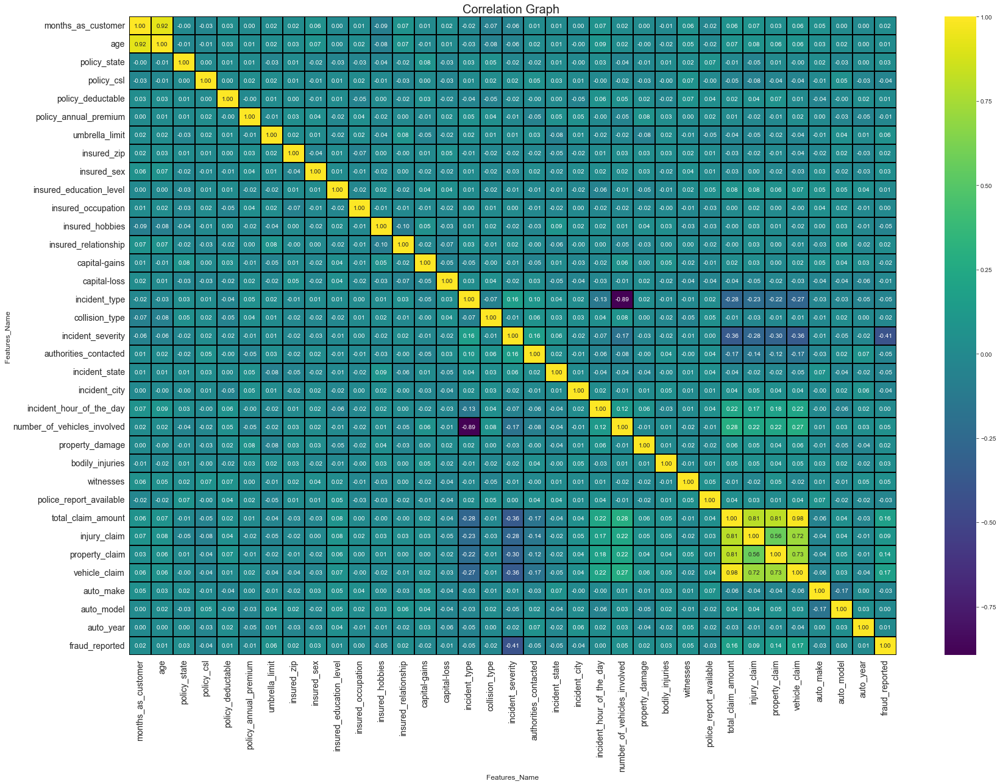

In [119]:
plt.figure(figsize=(25,18))
sns.heatmap(data=df.corr(),annot=True,fmt='0.2f',linecolor='black',linewidth=0.02,cmap='viridis')
plt.xlabel("Features_Name", fontsize=12)
plt.ylabel("Features_Name",fontsize=12)
plt.title("Correlation Graph ",fontsize=20)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.tight_layout()

## Observations

- incident_severity shows 41 percentage negative correlation with the target Variable is extreamly negative bond.
- incident_state shows 5 percentage negative correlation with the target Variable is quite negative.
- incident_type shows 5 percentage negative correlation with the target Variable is quite negative.  
- insured_hobbies shows 5 percentage negative correlation with the target Variable is quite negative.
- authorities_contacted shows 5 percentage negative correlation with the target Variable is quite negative.
- incident_city shows 4 percentage negative correlation with the target Variable is quite negative.
- policy_csl shows 4 percentage negative correlation with the target Variable is quite negative.
- police_report_available shows 3 percentage negative correlation with the target Variable is quite negative.
- auto_make shows 3 percentage negative correlation with the target Variable is quite negative.
- capital-gains shows 2 percentage negative correlation with the target Variable is quite negative.
- collision_type shows 2 percentage negative correlation with the target Variable is quite negative.
- capital-loss shows 1 percentage negative correlation with the target Variable is quite negative.
- policy_annual_premium shows 1 percentage negative correlation with the target Variable is quite negative.
- auto_model Shows 0 percentage No relation with target variable.
- insured_occupation Shows 0 percentage No relation with target variable.    
- incident_hour_of_the_day Shows 0 percentage No relation with target variable.
- auto_year Shows 1 percentage No relation with target variable.
- insured_education_level Shows 1 percentage postive correlation with target variable which is quite positive.
- age Shows 1 percentage postive correlation with target variable which is quite positive.
- policy_deductable Shows 1 percentage postive correlation with target variable which is quite positive
- property_damage Shows 2 percentage postive correlation with target variable which is quite positive
- insured_zip Shows 2 percentage postive correlation with target variable which is quite positive
- months_as_customer Shows 2 percentage postive correlation with target variable which is quite positive
- insured_relationship Shows 2 percentage postive correlation with target variable which is quite positive
- policy_state Shows 3 percentage postive correlation with target variable which is quite positive
- insured_sex  Shows 3 percentage postive correlation with target variable which is quite positive
- bodily_injuries Shows 3 percentage postive correlation with target variable which is quite positive
- witnesses  Shows 5 percentage postive correlation with target variable which is quite positive
- number_of_vehicles_involved  Shows 5 percentage postive correlation with target variable which is quite positive
- umbrella_limit Shows 6 percentage postive correlation with target variable which is quite good bond.
- injury_claim Shows 9 percentage postive correlation with target variable which is quite good bond.
- property_claim Shows 14 percentage postive correlation with target variable which is good positive bond.
- total_claim_amount Shows 16 percentage postive correlation with target variable which is strong bond.
- vehicle_claim Shows 17 percentage postive correlation with target variable which is strong bond.

## NOTE:

- Incident_severity is very negative to target variable.
- Vehicle is very positive towards the target variable. 

Text(0.5, 1.0, 'Correlation Graph')

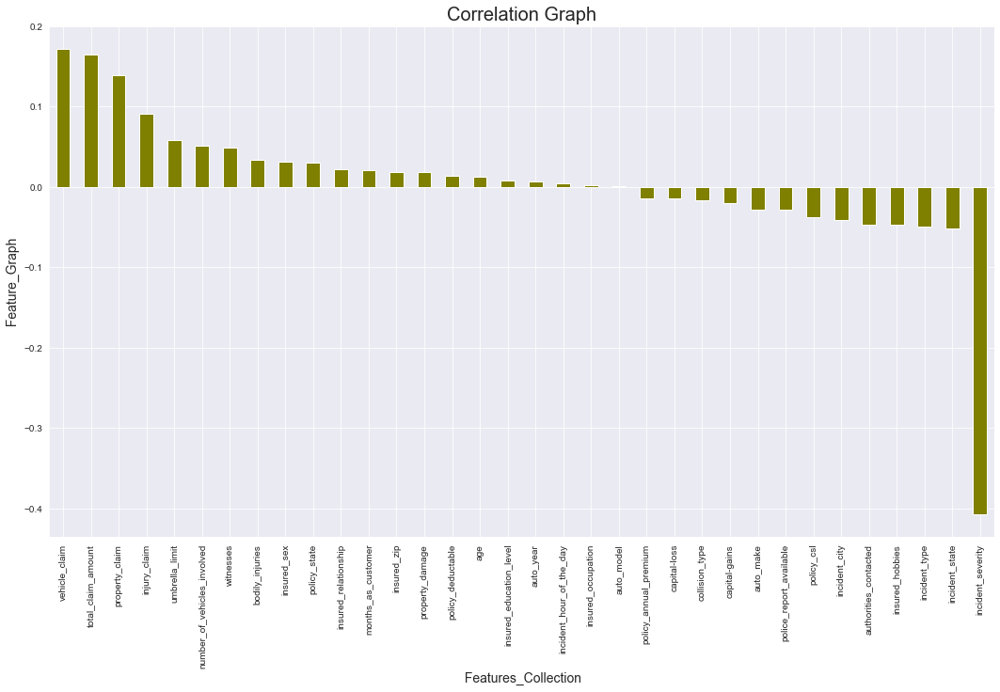

In [120]:
plt.figure(figsize=(18,10))
df.corr()['fraud_reported'].sort_values(ascending=False).drop(['fraud_reported']).plot(kind='bar',color='olive')
plt.xlabel(" Features_Collection",fontsize=14)
plt.ylabel(" Feature_Graph ",fontsize=14)
plt.title("Correlation Graph",fontsize=20)

## Outliers

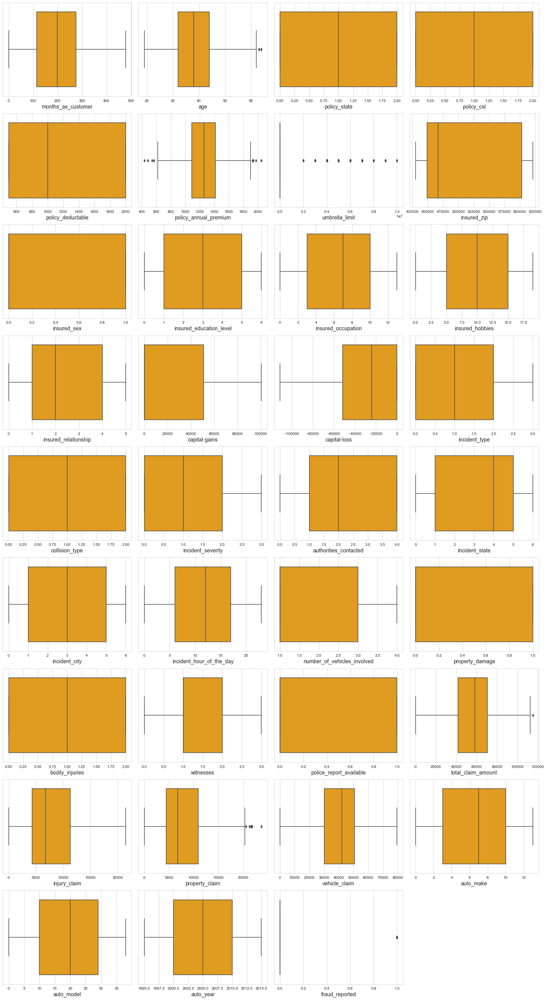

In [121]:
plt.figure(figsize=(20,40),facecolor='white',edgecolor='black',)

plotnumber=1

for column in df:
    if plotnumber<=40 : 
        sns.set_style('whitegrid')
        ax=plt.subplot(10,4,plotnumber)
        sns.boxplot(df[column],color='orange')
        plt.xlabel(column , fontsize=14)
        
    plotnumber+=1
plt.tight_layout()

## Observation:
- Age,policy_annual_premium,umbrella_limit,property_claim,fraud_reported showing Outliers

# Skewness

In [122]:
df.skew().sort_values()

vehicle_claim                 -0.622627
total_claim_amount            -0.595646
capital-loss                  -0.389813
incident_state                -0.150405
authorities_contacted         -0.123464
auto_model                    -0.079362
insured_hobbies               -0.060875
insured_occupation            -0.059339
auto_year                     -0.049502
incident_hour_of_the_day      -0.034990
collision_type                -0.032150
policy_state                  -0.024326
auto_make                     -0.020772
insured_education_level       -0.001183
policy_annual_premium          0.005374
bodily_injuries                0.012940
witnesses                      0.018399
incident_city                  0.048366
insured_relationship           0.078700
policy_csl                     0.087172
incident_type                  0.103399
insured_sex                    0.150802
injury_claim                   0.265382
incident_severity              0.277762
months_as_customer             0.364014


# Observation

Skewness Threshold to be taken +/- 65. Following Shows High Skewness

- police_report_available        0.801155
- insured_zip                    0.815133
- property_damage                0.867426
- fraud_reported                 1.173510
- umbrella_limit                 1.806100

<AxesSubplot:xlabel='police_report_available', ylabel='Density'>

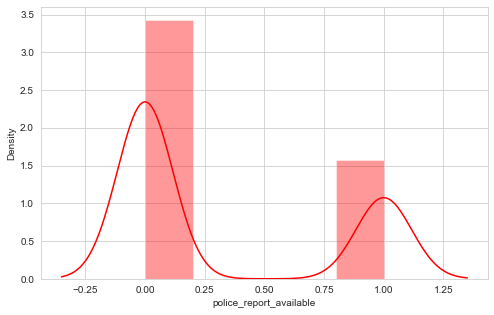

In [123]:
plt.figure(figsize=(8,5))
sns.distplot(df['police_report_available'],color='r',kde=True)

The data in the given graph shows is not normalised.The Building blocks are beyond the normal curve.(Bi-Modal)

<AxesSubplot:xlabel='insured_zip', ylabel='Density'>

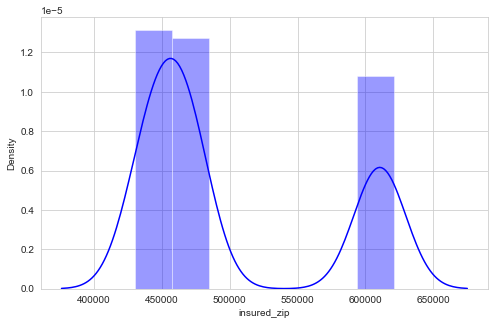

In [124]:
plt.figure(figsize=(8,5))
sns.distplot(df['insured_zip'],color='blue',kde=True)

The data in the given graph shows is not normalised.The Building blocks are beyond the normal curve.(Bi-Modal)

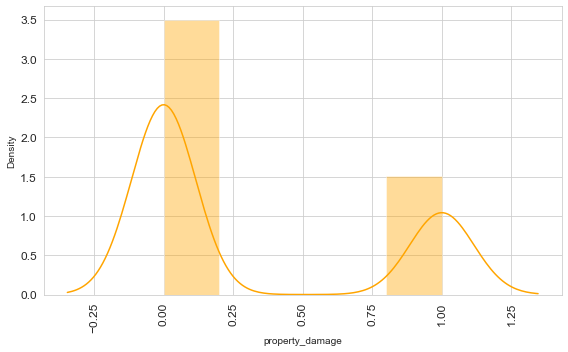

In [125]:
plt.figure(figsize=(8,5))
sns.distplot(df['property_damage'],color='orange',kde=True)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

The data in the given graph shows is not normalised.The Building blocks are beyond the normal curve.(Bi-Modal)

<AxesSubplot:xlabel='fraud_reported', ylabel='Density'>

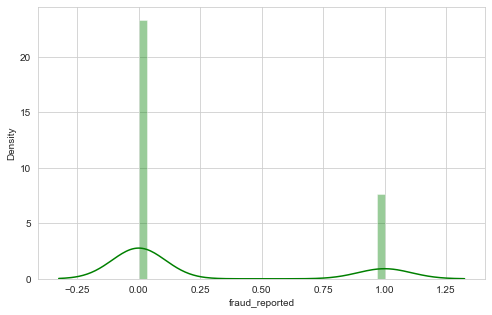

In [126]:
plt.figure(figsize=(8,5))
sns.distplot(df['fraud_reported'],color='green',kde=True)

The data in the given graph shows is not normalised.The Building blocks are beyond the normal curve.(Bi-Modal)

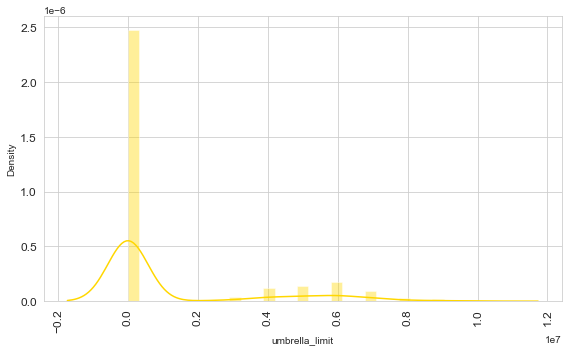

In [127]:
plt.figure(figsize=(8,5))
sns.distplot(df['umbrella_limit'],color='gold',kde=True)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.tight_layout()

The data in the given graph shows is not normalised.The Building blocks are beyond the normal curve.(Bi-Modal)

# Data Cleansing

In [128]:
print(round(df.corr()['fraud_reported'].sort_values(),2))

incident_severity             -0.41
incident_state                -0.05
incident_type                 -0.05
insured_hobbies               -0.05
authorities_contacted         -0.05
incident_city                 -0.04
policy_csl                    -0.04
police_report_available       -0.03
auto_make                     -0.03
capital-gains                 -0.02
collision_type                -0.02
capital-loss                  -0.01
policy_annual_premium         -0.01
auto_model                     0.00
insured_occupation             0.00
incident_hour_of_the_day       0.00
auto_year                      0.01
insured_education_level        0.01
age                            0.01
policy_deductable              0.01
property_damage                0.02
insured_zip                    0.02
months_as_customer             0.02
insured_relationship           0.02
policy_state                   0.03
insured_sex                    0.03
bodily_injuries                0.03
witnesses                   

## Deleting columns shows Least Relationship and Badly correlated Data

1. Relation Close to Zero
  - auto_model                     0.00
  - insured_occupation             0.00
  - incident_hour_of_the_day       0.00
  

2. Badly Correlated
 - incident_severity             -0.41

In [129]:
delete=pd.DataFrame({'Columns':['auto_model','insured_occupation','incident_hour_of_the_day','incident_severity','policy_annual_premium'],
       'Values':[0.00,0.00,0.00,-0.41,0.01],
       'Outliers':['N','N','N','N','Y'],
       'NORMALISED':['Y','Y','Y','Y','Y']})
delete

,Columns,Values,Outliers,NORMALISED
0,auto_model,0.00,N,Y
1,insured_occupation,0.00,N,Y
2,incident_hour_of_the_day,0.00,N,Y
3,incident_severity,-0.41,N,Y
4,policy_annual_premium,0.01,Y,Y


In [130]:
df.drop(['auto_model','insured_occupation','incident_hour_of_the_day','incident_severity','policy_annual_premium'],axis=1,inplace=True)

In [131]:
print(round(df.corr()['fraud_reported'].sort_values(),2))

incident_state                -0.05
incident_type                 -0.05
insured_hobbies               -0.05
authorities_contacted         -0.05
incident_city                 -0.04
policy_csl                    -0.04
police_report_available       -0.03
auto_make                     -0.03
capital-gains                 -0.02
collision_type                -0.02
capital-loss                  -0.01
auto_year                      0.01
insured_education_level        0.01
age                            0.01
policy_deductable              0.01
property_damage                0.02
insured_zip                    0.02
months_as_customer             0.02
insured_relationship           0.02
policy_state                   0.03
insured_sex                    0.03
bodily_injuries                0.03
witnesses                      0.05
number_of_vehicles_involved    0.05
umbrella_limit                 0.06
injury_claim                   0.09
property_claim                 0.14
total_claim_amount          

# Zscore

In [132]:
from scipy.stats import zscore
z=np.abs(zscore(df))
z.head(3)

,months_as_customer,age,policy_state,policy_csl,policy_deductable,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,authorities_contacted,incident_state,incident_city,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_year,fraud_reported
0,1.078558,0.990731,1.188606,0.059765,0.223433,0.480353,0.490354,1.078118,0.529757,1.281352,1.437401,1.010334,0.954763,0.766613,1.345890,1.196148,0.350479,0.964184,0.824557,1.522806,0.008550,0.461213,1.477000,0.716353,0.188963,1.169319,0.751883,0.855489,0.185076,1.744859
1,0.209637,0.334259,0.015671,0.059765,1.411801,1.696927,0.461836,1.078118,0.529757,0.928861,0.246224,0.902746,0.954763,1.691549,0.028899,1.196148,0.814839,0.994575,0.824557,0.656683,1.211668,1.338598,0.677048,1.807066,1.362945,1.372787,1.823207,0.359618,0.314179,1.744859
2,0.607149,1.088095,1.188606,1.184089,1.411801,1.696927,0.985654,0.927543,1.557383,1.362329,0.349364,0.357087,0.954763,1.083258,0.028899,1.196148,1.042604,0.964184,1.139049,0.656683,1.228768,1.361118,0.677048,0.685294,0.054849,0.735184,0.784582,0.632124,0.314179,0.573112


In [133]:
# Here threshold is 3, checking values where z>3

np.where(z>3)

(array([ 31,  48,  88, 115, 119, 262, 313, 429, 457, 499, 502, 656, 699,
        806, 874, 921, 974], dtype=int64),
 array([ 5,  5,  5,  5,  5,  5,  5,  5,  5, 25,  5,  5,  5, 12,  5,  5,  5],
       dtype=int64))

In [134]:
# checking
z.iloc[31,5]

3.003294466491944

In [135]:
# No removal as no order shows outliers. we will continue with old df
# copying df to to new df as back up purpose

new_df=pd.DataFrame(data=df)

In [136]:
x=new_df.iloc[:,:-1]
y=new_df.iloc[:,-1]

In [137]:
x.head(5)

,months_as_customer,age,policy_state,policy_csl,policy_deductable,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,authorities_contacted,incident_state,incident_city,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_year
0,328,48,2,1,1000,0,466132,1,4,17,0,53300,0,2,2,4,4,1,1,1,1,2,1,71610,6510,13020,52080,10,2004
1,228,42,1,1,2000,5000000,468176,1,4,15,2,0,0,3,1,4,5,5,1,0,0,0,0,5070,780,780,3510,8,2007
2,134,29,2,0,2000,5000000,430632,0,6,2,3,35100,0,0,1,4,1,1,3,0,2,3,0,34650,7700,3850,23100,4,2007
3,256,41,0,1,2000,6000000,608117,0,6,2,4,48900,-62400,2,0,4,2,0,1,0,1,2,0,63400,6340,6340,50720,3,2014
4,228,44,0,2,1000,6000000,610706,1,0,2,4,66000,-46000,3,1,2,1,0,1,0,0,1,0,6500,1300,650,4550,0,2009


In [138]:
y.head(5)

0    1
1    1
2    0
3    1
4    0
Name: fraud_reported, dtype: int32

In [139]:
print("Shape of X ",x.shape," Shape of Y ",y.shape)

Shape of X  (999, 29)  Shape of Y  (999,)


In [204]:
x.columns

Index(['months_as_customer', 'age', 'policy_state', 'policy_csl',
       'policy_deductable', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_hobbies', 'insured_relationship',
       'capital-gains', 'capital-loss', 'incident_type', 'collision_type',
       'authorities_contacted', 'incident_state', 'incident_city',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_year'],
      dtype='object')

# 3. Removing Skewness

In [205]:
from sklearn.preprocessing import PowerTransformer
pt=PowerTransformer()

x=pt.fit_transform(x)

In [206]:
x

array([[ 1.05164678,  1.00874764,  1.14704131, ...,  0.75610579,
         0.85816684, -0.19943088],
       [ 0.30541875,  0.43189324,  0.07364796, ..., -1.7862987 ,
         0.41741198,  0.30098248],
       [-0.51007887, -1.13869052,  1.14704131, ..., -0.82021343,
        -0.55637116,  0.30098248],
       ...,
       [-0.54855626, -0.4696231 ,  1.14704131, ...,  0.77967253,
         1.07036271, -1.49825549],
       [ 1.91217848,  2.12923176, -1.25870523, ..., -0.10290462,
        -1.44103167, -1.17834114],
       [ 1.89963836,  1.9846111 ,  1.14704131, ..., -1.77876031,
         0.41741198,  0.30098248]])

In [207]:
x=pd.DataFrame(data=x,columns=['months_as_customer', 'age', 'policy_state', 'policy_csl',
       'policy_deductable', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_hobbies', 'insured_relationship',
       'capital-gains', 'capital-loss', 'incident_type', 'collision_type',
       'authorities_contacted', 'incident_state', 'incident_city',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_year'])

In [208]:
x.skew().sort_values()

vehicle_claim                 -0.523647
total_claim_amount            -0.511002
injury_claim                  -0.415607
property_claim                -0.359152
incident_state                -0.256218
insured_hobbies               -0.247725
auto_make                     -0.228303
authorities_contacted         -0.227864
insured_education_level       -0.188463
incident_city                 -0.181858
insured_relationship          -0.160058
witnesses                     -0.154129
policy_state                  -0.144565
months_as_customer            -0.135288
bodily_injuries               -0.129614
collision_type                -0.128892
policy_csl                    -0.101535
incident_type                 -0.087624
auto_year                     -0.012755
age                           -0.001869
insured_zip                    0.000000
policy_deductable              0.023292
capital-gains                  0.036789
capital-loss                   0.092536
insured_sex                    0.150802


In [210]:
x['umbrella_limit']=np.sqrt(x['umbrella_limit']+0)

In [211]:
x['property_damage']=np.log(x['property_damage']+0)

In [212]:
x['police_report_available']=np.log(x['police_report_available']-1)

In [213]:
x.skew().sort_values()

umbrella_limit                -0.983897
vehicle_claim                 -0.523647
total_claim_amount            -0.511002
injury_claim                  -0.415607
property_claim                -0.359152
incident_state                -0.256218
insured_hobbies               -0.247725
auto_make                     -0.228303
authorities_contacted         -0.227864
insured_education_level       -0.188463
incident_city                 -0.181858
insured_relationship          -0.160058
witnesses                     -0.154129
policy_state                  -0.144565
months_as_customer            -0.135288
bodily_injuries               -0.129614
collision_type                -0.128892
policy_csl                    -0.101535
incident_type                 -0.087624
auto_year                     -0.012755
age                           -0.001869
property_damage                0.000000
police_report_available        0.000000
insured_zip                    0.000000
policy_deductable              0.023292


In [215]:
x.drop(['property_damage','police_report_available','insured_zip','umbrella_limit'],axis=1,inplace=True)

In [216]:
x.skew().sort_values()

vehicle_claim                 -0.523647
total_claim_amount            -0.511002
injury_claim                  -0.415607
property_claim                -0.359152
incident_state                -0.256218
insured_hobbies               -0.247725
auto_make                     -0.228303
authorities_contacted         -0.227864
insured_education_level       -0.188463
incident_city                 -0.181858
insured_relationship          -0.160058
witnesses                     -0.154129
policy_state                  -0.144565
months_as_customer            -0.135288
bodily_injuries               -0.129614
collision_type                -0.128892
policy_csl                    -0.101535
incident_type                 -0.087624
auto_year                     -0.012755
age                           -0.001869
policy_deductable              0.023292
capital-gains                  0.036789
capital-loss                   0.092536
insured_sex                    0.150802
number_of_vehicles_involved    0.362112


# Using Standard Scaler

In [217]:
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()

x=ss.fit_transform(x)

In [218]:
x

array([[ 1.05164678,  1.00874764,  1.14704131, ...,  0.75610579,
         0.85816684, -0.19943088],
       [ 0.30541875,  0.43189324,  0.07364796, ..., -1.7862987 ,
         0.41741198,  0.30098248],
       [-0.51007887, -1.13869052,  1.14704131, ..., -0.82021343,
        -0.55637116,  0.30098248],
       ...,
       [-0.54855626, -0.4696231 ,  1.14704131, ...,  0.77967253,
         1.07036271, -1.49825549],
       [ 1.91217848,  2.12923176, -1.25870523, ..., -0.10290462,
        -1.44103167, -1.17834114],
       [ 1.89963836,  1.9846111 ,  1.14704131, ..., -1.77876031,
         0.41741198,  0.30098248]])

In [219]:
print(" Mean ",round(x.mean(),2)," Standard Deviation ",round(x.std(),2))

 Mean  -0.0  Standard Deviation  1.0


# Checking Target variable

<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

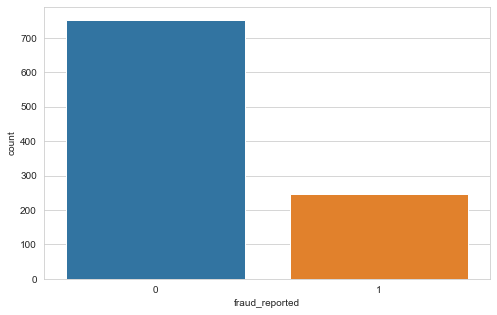

In [220]:
plt.figure(figsize=(8,5))
sns.countplot(x=y)

In [221]:
from imblearn.over_sampling import SMOTE
smt=SMOTE()

In [222]:
x,y=smt.fit_resample(x,y)

1    752
0    752
Name: fraud_reported, dtype: int64

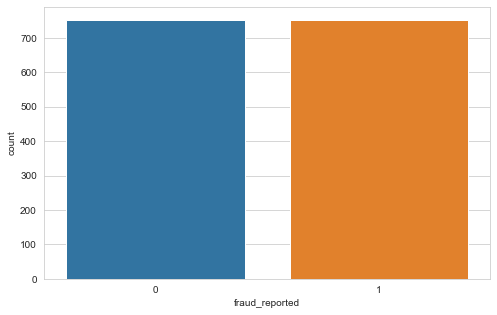

In [223]:
plt.figure(figsize=(8,5))
sns.countplot(x=y)
y.value_counts()

#  Importing Model:

In [224]:
# linear_model,train test and metrics
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix

# Clssifiers
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.linear_model import SGDClassifier

# cross Validation
from sklearn.model_selection import cross_val_score

# Ensamble
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier

# neural network
from sklearn.neural_network import MLPClassifier

# hyper paramter
from sklearn.model_selection import GridSearchCV


# Instances :
lg=LogisticRegression()
dtc=DecisionTreeClassifier()
knc=KNeighborsClassifier()
gnb=GaussianNB()
svc=SVC()
sgd=SGDClassifier()
etc=ExtraTreesClassifier()
rfc=RandomForestClassifier()
ada=AdaBoostClassifier()
gbc=GradientBoostingClassifier()
mlp=MLPClassifier()

## Train Test

In [225]:
for i in range(0,1000):
    x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=i,test_size=0.20)
    #train and score
    lg.fit(x_train,y_train)
    lg.score(x_train,y_train)
    
    #predict train and test
    pred_train=lg.predict(x_train)
    pred_test=lg.predict(x_test)
    
    # loop
    if round(accuracy_score(y_train,pred_train)*100,1)==round(accuracy_score(y_test,pred_test)*100,1):
        print("The random state:-",i)
        print("Training accuracy_score is ",accuracy_score(y_train,pred_train)*100)
        print("Testing accuracy_score is ",accuracy_score(y_test,pred_test)*100,"\n")

The random state:- 302
Training accuracy_score is  63.092269326683294
Testing accuracy_score is  63.12292358803987 

The random state:- 714
Training accuracy_score is  60.76475477971738
Testing accuracy_score is  60.797342192691026 

The random state:- 816
Training accuracy_score is  61.51288445552785
Testing accuracy_score is  61.461794019933556 



In [227]:
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=302,test_size=0.20)

#sent for training
lg.fit(x_train,y_train)

#predict(x_training data)
pred_train=lg.predict(x_train) 
pred_test=lg.predict(x_test) 

#result
print("Accuracy Training Score =",accuracy_score(y_train,pred_train)," Accuracy Test Score =",accuracy_score(y_test,pred_test),"\n")
print("Training Confusion_Matrix \n",confusion_matrix(y_train,pred_train),'\n',"Testing Confusion_Matrix \n",confusion_matrix(y_test,pred_test),"\n")
print("Classification Report \n",classification_report(y_test,pred_test),'\n\n')

Accuracy Training Score = 0.6309226932668329  Accuracy Test Score = 0.6312292358803987 

Training Confusion_Matrix 
 [[327 270]
 [174 432]] 
 Testing Confusion_Matrix 
 [[ 89  66]
 [ 45 101]] 

Classification Report 
               precision    recall  f1-score   support

           0       0.66      0.57      0.62       155
           1       0.60      0.69      0.65       146

    accuracy                           0.63       301
   macro avg       0.63      0.63      0.63       301
weighted avg       0.64      0.63      0.63       301
 




## Model Cross Validation

In [228]:
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy =accuracy_score(y_test,pred_test)

for i in range(2,10):
    cv_score=cross_val_score(lg,x,y,cv=i)
    cv_mean=cv_score.mean()
    
    print("A cross-fold ",i,"CV_mean ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  2 CV_mean  0.581781914893617 Training Score  0.6309226932668329 Testing Score  0.6312292358803987
A cross-fold  3 CV_mean  0.5857899075686608 Training Score  0.6309226932668329 Testing Score  0.6312292358803987
A cross-fold  4 CV_mean  0.5990691489361702 Training Score  0.6309226932668329 Testing Score  0.6312292358803987
A cross-fold  5 CV_mean  0.5864784053156147 Training Score  0.6309226932668329 Testing Score  0.6312292358803987
A cross-fold  6 CV_mean  0.5978220451527224 Training Score  0.6309226932668329 Testing Score  0.6312292358803987
A cross-fold  7 CV_mean  0.5931257180116124 Training Score  0.6309226932668329 Testing Score  0.6312292358803987
A cross-fold  8 CV_mean  0.5930851063829787 Training Score  0.6309226932668329 Testing Score  0.6312292358803987
A cross-fold  9 CV_mean  0.5910797452713621 Training Score  0.6309226932668329 Testing Score  0.6312292358803987


### Selected Cross Fold-9 as cv score is close to Testing Score

In [229]:
# accuracy score
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

#score and mean
cv_score =cross_val_score(lg,x,y,cv=9)
cv_mean  =cv_score.mean()

# result
print("A cross-fold ",i,"CV_mean ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  9 CV_mean  0.5910797452713621 Training Score  0.6309226932668329 Testing Score  0.6312292358803987


## Model Graph

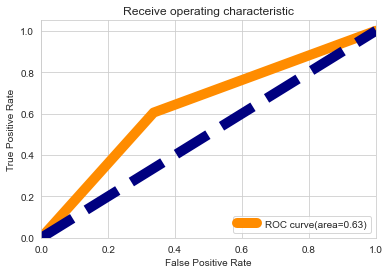

In [230]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds= roc_curve(pred_test,y_test)
roc_auc = auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve(area=%0.2f)' % roc_auc)

plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receive operating characteristic")
plt.legend(loc="lower right")
plt.show()

# Decision Tree

In [231]:
#train and score
dtc.fit(x_train,y_train)
dtc_score=dtc.score(x_train,y_train)

#predict
pred_train=dtc.predict(x_train)
pred_test=dtc.predict(x_test)

#result
print("Accuracy Training Score =",accuracy_score(y_train,pred_train)," Accuracy Test Score =",accuracy_score(y_test,pred_test),"\n")
print("Training Confusion_Matrix \n",confusion_matrix(y_train,pred_train),"Testing Confusion_Matrix \n",confusion_matrix(y_test,pred_test))
print("Classification Report \n",classification_report(y_test,pred_test),)

Accuracy Training Score = 1.0  Accuracy Test Score = 0.7641196013289037 

Training Confusion_Matrix 
 [[597   0]
 [  0 606]] Testing Confusion_Matrix 
 [[121  34]
 [ 37 109]]
Classification Report 
               precision    recall  f1-score   support

           0       0.77      0.78      0.77       155
           1       0.76      0.75      0.75       146

    accuracy                           0.76       301
   macro avg       0.76      0.76      0.76       301
weighted avg       0.76      0.76      0.76       301



## Model Cross Validation

In [232]:
#train test Accuracy
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy =accuracy_score(y_test,pred_test)

#Range finding cv Score
for i in range(2,10):
    cv_score=cross_val_score(dtc,x,y,cv=i)
    cv_mean=cv_score.mean()
    
    print("A cross-fold ",i,"CV_mean ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  2 CV_mean  0.7027925531914894 Training Score  1.0 Testing Score  0.7641196013289037
A cross-fold  3 CV_mean  0.7321002086133178 Training Score  1.0 Testing Score  0.7641196013289037
A cross-fold  4 CV_mean  0.7273936170212765 Training Score  1.0 Testing Score  0.7641196013289037
A cross-fold  5 CV_mean  0.736077519379845 Training Score  1.0 Testing Score  0.7641196013289037
A cross-fold  6 CV_mean  0.7474661354581674 Training Score  1.0 Testing Score  0.7641196013289037
A cross-fold  7 CV_mean  0.7440587449933244 Training Score  1.0 Testing Score  0.7641196013289037
A cross-fold  8 CV_mean  0.7426861702127658 Training Score  1.0 Testing Score  0.7641196013289037
A cross-fold  9 CV_mean  0.7481030003485094 Training Score  1.0 Testing Score  0.7641196013289037


### Selected Cross Fold-9 as cv score is close to Testing Score

In [233]:
# accuracy score
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

#score and mean
cv_score =cross_val_score(dtc,x,y,cv=9)
cv_mean  =cv_score.mean()

# result
print("A cross-fold ",i,"CV_mean ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  9 CV_mean  0.7348121217881697 Training Score  1.0 Testing Score  0.7641196013289037


## Model Graph

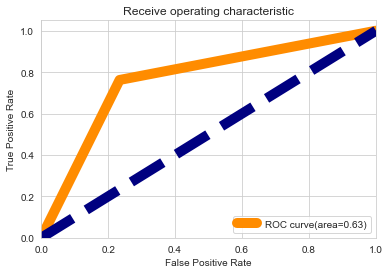

In [234]:
from sklearn.metrics import roc_curve

fpr,tpr,thresholds= roc_curve(pred_test,y_test)
roc_curve=auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve(area=%0.2f)' % roc_auc)

plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receive operating characteristic")
plt.legend(loc="lower right")
plt.show()

# Kneighbors Classifier

In [235]:
# train and score
knc.fit(x_train,y_train)
knc_score=knc.score(x_train,y_train)

#predict
pred_train= knc.predict(x_train)
pred_test = knc.predict(x_test)

#result
print("Training Score",knc_score)
print("Accuracy Training Score =",accuracy_score(y_train,pred_train)," Accuracy Test Score =",accuracy_score(y_test,pred_test),"\n")
print("Training Confusion_Matrix \n",confusion_matrix(y_train,pred_train),"\n","Testing Confusion_Matrix \n",confusion_matrix(y_test,pred_test))
print("Classification Report \n",classification_report(y_test,pred_test),)

Training Score 0.7797173732335827
Accuracy Training Score = 0.7797173732335827  Accuracy Test Score = 0.6976744186046512 

Training Confusion_Matrix 
 [[351 246]
 [ 19 587]] 
 Testing Confusion_Matrix 
 [[ 73  82]
 [  9 137]]
Classification Report 
               precision    recall  f1-score   support

           0       0.89      0.47      0.62       155
           1       0.63      0.94      0.75       146

    accuracy                           0.70       301
   macro avg       0.76      0.70      0.68       301
weighted avg       0.76      0.70      0.68       301



## Model Cross Validation

In [236]:
#accuracy
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy =accuracy_score(y_test,pred_test)

#range for cv 
for i in range(2,10):
    cv_score=cross_val_score(knc,x,y,cv=i)
    cv_mean=cv_score.mean()
    
    print("A cross-fold ",i,"CV_mean ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  2 CV_mean  0.6642287234042553 Training Score  0.7797173732335827 Testing Score  0.6976744186046512
A cross-fold  3 CV_mean  0.6868626624572899 Training Score  0.7797173732335827 Testing Score  0.6976744186046512
A cross-fold  4 CV_mean  0.6894946808510638 Training Score  0.7797173732335827 Testing Score  0.6976744186046512
A cross-fold  5 CV_mean  0.690828349944629 Training Score  0.7797173732335827 Testing Score  0.6976744186046512
A cross-fold  6 CV_mean  0.6961699867197875 Training Score  0.7797173732335827 Testing Score  0.6976744186046512
A cross-fold  7 CV_mean  0.6868506846337752 Training Score  0.7797173732335827 Testing Score  0.6976744186046512
A cross-fold  8 CV_mean  0.6908244680851063 Training Score  0.7797173732335827 Testing Score  0.6976744186046512
A cross-fold  9 CV_mean  0.6935058454519534 Training Score  0.7797173732335827 Testing Score  0.6976744186046512


### Selected Cross Fold-8 as cv score is close to Testing Score

In [237]:
#accuracy
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy =accuracy_score(y_test,pred_test)

#cross val score(K_neighbors)
knc_cv_score=cross_val_score(knc,x,y,cv=8) # cv_score is near to training score
knc_mean=knc_cv_score.mean()

#predict result
print(" Cross Validation_mean ",knc_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

 Cross Validation_mean  0.6908244680851063 Training Score  0.7797173732335827 Testing Score  0.6976744186046512


## Model Graph

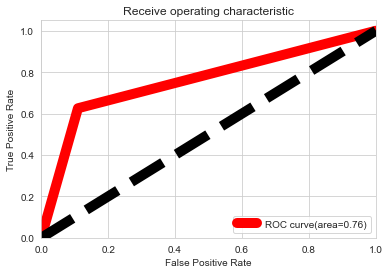

In [238]:
## AOC ROC score curve 
from sklearn.metrics import roc_curve

fpr,tpr,thresholds= roc_curve(pred_test,y_test)
roc_auc =auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='red',lw=10,label='ROC curve(area=%0.2f)' % roc_auc)

plt.plot([0,1],[0,1],color='black',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receive operating characteristic")
plt.legend(loc="lower right")
plt.show()

# Model 3: SVC (Support Vector Machine)

In [239]:
#train and score
svc.fit(x_train,y_train)
svc_score=svc.score(x_train,y_train)

# predict
pred_train=svc.predict(x_train)
pred_test=svc.predict(x_test)

#result
print("Accuracy Training Score =",accuracy_score(y_train,pred_train)," Accuracy Test Score =",accuracy_score(y_test,pred_test),"\n")
print("Training Confusion_Matrix \n",confusion_matrix(y_train,pred_train),"Testing Confusion_Matrix \n",confusion_matrix(y_test,pred_test))
print("Classification Report \n",classification_report(y_test,pred_test),)

Accuracy Training Score = 0.9168744804655029  Accuracy Test Score = 0.8106312292358804 

Training Confusion_Matrix 
 [[535  62]
 [ 38 568]] Testing Confusion_Matrix 
 [[124  31]
 [ 26 120]]
Classification Report 
               precision    recall  f1-score   support

           0       0.83      0.80      0.81       155
           1       0.79      0.82      0.81       146

    accuracy                           0.81       301
   macro avg       0.81      0.81      0.81       301
weighted avg       0.81      0.81      0.81       301



## Model Cross Validation

In [240]:
#score
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

#cross val 
for i in range(2,10):
    cv_svc_score=cross_val_score(svc,x,y,cv=i)
    cv_mean=cv_svc_score.mean() 
    
    #print
    print("A cross-fold ",i,"CV_mean ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  2 CV_mean  0.7599734042553191 Training Score  0.9168744804655029 Testing Score  0.8106312292358804
A cross-fold  3 CV_mean  0.7586685858031613 Training Score  0.9168744804655029 Testing Score  0.8106312292358804
A cross-fold  4 CV_mean  0.7918882978723404 Training Score  0.9168744804655029 Testing Score  0.8106312292358804
A cross-fold  5 CV_mean  0.7925736434108527 Training Score  0.9168744804655029 Testing Score  0.8106312292358804
A cross-fold  6 CV_mean  0.7959628154050464 Training Score  0.9168744804655029 Testing Score  0.8106312292358804
A cross-fold  7 CV_mean  0.7945912379296426 Training Score  0.9168744804655029 Testing Score  0.8106312292358804
A cross-fold  8 CV_mean  0.7992021276595744 Training Score  0.9168744804655029 Testing Score  0.8106312292358804
A cross-fold  9 CV_mean  0.7999318822672117 Training Score  0.9168744804655029 Testing Score  0.8106312292358804


### Selected Cross Fold-9 as cv score is close to Testing Score

In [241]:
#accuracy score
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy =accuracy_score(y_test,pred_test)

#cross val score
svc_cv_score=cross_val_score(svc,x,y,cv=9)
svc_mean=svc_cv_score.mean()

print(" CV_mean ",svc_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

 CV_mean  0.7999318822672117 Training Score  0.9168744804655029 Testing Score  0.8106312292358804


## Model Graph

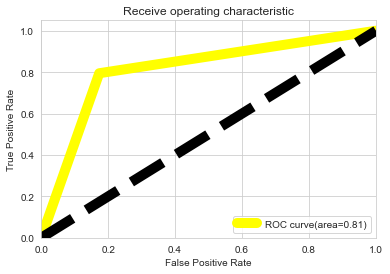

In [242]:
## AOC ROC score curve 
from sklearn.metrics import roc_curve

fpr,tpr,thresholds= roc_curve(pred_test,y_test)
roc_auc =auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='yellow',lw=10,label='ROC curve(area=%0.2f)' % roc_auc)

plt.plot([0,1],[0,1],color='black',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receive operating characteristic")
plt.legend(loc="lower right")
plt.show()

# Model 4 Naive_bayes

In [243]:
from sklearn.naive_bayes import GaussianNB
gnb=GaussianNB()

#train and score
gnb.fit(x_train,y_train)
gnb_score=gnb.score(x_train,y_train)

# predict
pred_train=gnb.predict(x_train)
pred_test=gnb.predict(x_test)

#result
print("Accuracy Training Score =",accuracy_score(y_train,pred_train)," Accuracy Test Score =",accuracy_score(y_test,pred_test),"\n")
print("Training Confusion_Matrix \n",confusion_matrix(y_train,pred_train),"Testing Confusion_Matrix \n",confusion_matrix(y_test,pred_test))
print("Classification Report \n",classification_report(y_test,pred_test))

Accuracy Training Score = 0.6192851205320034  Accuracy Test Score = 0.6079734219269103 

Training Confusion_Matrix 
 [[219 378]
 [ 80 526]] Testing Confusion_Matrix 
 [[ 60  95]
 [ 23 123]]
Classification Report 
               precision    recall  f1-score   support

           0       0.72      0.39      0.50       155
           1       0.56      0.84      0.68       146

    accuracy                           0.61       301
   macro avg       0.64      0.61      0.59       301
weighted avg       0.65      0.61      0.59       301



## Model Cross Validation

In [244]:
#score
gnb_train=accuracy_score(y_train,pred_train)
gnb_test=accuracy_score(y_test,pred_test)

#cross val 
for i in range(2,10):
    cv_gnb_score=cross_val_score(gnb,x,y,cv=i)
    cv_mean=cv_gnb_score.mean()    
    #print
    print("A cross-fold ",i,"CV_mean ",cv_mean,"Training Score ",gnb_train,"Testing Score ",gnb_test)

A cross-fold  2 CV_mean  0.6123670212765957 Training Score  0.6192851205320034 Testing Score  0.6079734219269103
A cross-fold  3 CV_mean  0.6070621042112322 Training Score  0.6192851205320034 Testing Score  0.6079734219269103
A cross-fold  4 CV_mean  0.6090425531914894 Training Score  0.6192851205320034 Testing Score  0.6079734219269103
A cross-fold  5 CV_mean  0.6083986710963456 Training Score  0.6192851205320034 Testing Score  0.6079734219269103
A cross-fold  6 CV_mean  0.6070916334661355 Training Score  0.6192851205320034 Testing Score  0.6079734219269103
A cross-fold  7 CV_mean  0.6137175148259695 Training Score  0.6192851205320034 Testing Score  0.6079734219269103
A cross-fold  8 CV_mean  0.6110372340425532 Training Score  0.6192851205320034 Testing Score  0.6079734219269103
A cross-fold  9 CV_mean  0.6123388144346228 Training Score  0.6192851205320034 Testing Score  0.6079734219269103


### Selected Cross Fold-9 as cv score is close to Testing Score

In [245]:
#score
gnb_train=accuracy_score(y_train,pred_train)
gnb_test=accuracy_score(y_test,pred_test)

#cross val score
cv_gnb_score=cross_val_score(gnb,x,y,cv=9)
gnb_mean=cv_gnb_score.mean()

print(" CV_mean ",gnb_mean,"Training Score ",gnb_train,"Testing Score ",gnb_test)

 CV_mean  0.6123388144346228 Training Score  0.6192851205320034 Testing Score  0.6079734219269103


## Model Graph

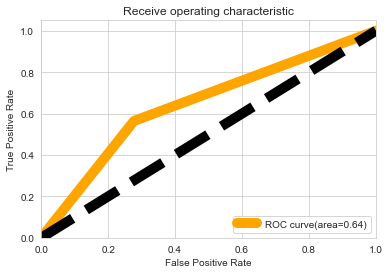

In [246]:
## AOC ROC score curve 
from sklearn.metrics import roc_curve

fpr,tpr,thresholds= roc_curve(pred_test,y_test)
roc_auc =auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='orange',lw=10,label='ROC curve(area=%0.2f)' % roc_auc)

plt.plot([0,1],[0,1],color='black',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receive operating characteristic")
plt.legend(loc="lower right")
plt.show()

# Ensamble Technique

## Model1 Extra Trees Classifier

In [272]:
# train and score
etc.fit(x_train,y_train)
etc_score=etc.score(x_train,y_train)

#predict
pred_train=etc.predict(x_train)
pred_test=etc.predict(x_test)

#result
print("Accuracy Training Score =",accuracy_score(y_train,pred_train)," Accuracy Test Score =",accuracy_score(y_test,pred_test),"\n")
print("Training Confusion_Matrix \n",confusion_matrix(y_train,pred_train),"Testing Confusion_Matrix \n",confusion_matrix(y_test,pred_test))
print("Classification Report \n",classification_report(y_test,pred_test))

Accuracy Training Score = 1.0  Accuracy Test Score = 0.9102990033222591 

Training Confusion_Matrix 
 [[597   0]
 [  0 606]] Testing Confusion_Matrix 
 [[146   9]
 [ 18 128]]
Classification Report 
               precision    recall  f1-score   support

           0       0.89      0.94      0.92       155
           1       0.93      0.88      0.90       146

    accuracy                           0.91       301
   macro avg       0.91      0.91      0.91       301
weighted avg       0.91      0.91      0.91       301



## Model Cross Validation

In [273]:
#Accuracy_Score
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

#cross val
for i in range(2,10):
    cv_etc_score=cross_val_score(etc,x,y,cv=i)
    cv_mean=cv_etc_score.mean()
    
    #print
    print("A cross-fold ",i,"CV_Score ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  2 CV_Score  0.8484042553191489 Training Score  1.0 Testing Score  0.9102990033222591
A cross-fold  3 CV_Score  0.8969816012066173 Training Score  1.0 Testing Score  0.9102990033222591
A cross-fold  4 CV_Score  0.9075797872340425 Training Score  1.0 Testing Score  0.9102990033222591
A cross-fold  5 CV_Score  0.9129147286821706 Training Score  1.0 Testing Score  0.9102990033222591
A cross-fold  6 CV_Score  0.9136308100929614 Training Score  1.0 Testing Score  0.9102990033222591
A cross-fold  7 CV_Score  0.9162573353618778 Training Score  1.0 Testing Score  0.9102990033222591
A cross-fold  8 CV_Score  0.9069148936170213 Training Score  1.0 Testing Score  0.9102990033222591
A cross-fold  9 CV_Score  0.9262665145898679 Training Score  1.0 Testing Score  0.9102990033222591


### Selected Cross Fold-9 as cv score is close to Testing Score

In [274]:
#Accuracy_Score
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

#cross val score
etc_cv_score=cross_val_score(etc,x,y,cv=9)
etc_mean=etc_cv_score.mean()

print(" CV_mean ",etc_mean,"Testing Accuracy Score ",test_accuracy)

 CV_mean  0.9188829787234043 Testing Accuracy Score  0.9102990033222591


## Model Graph

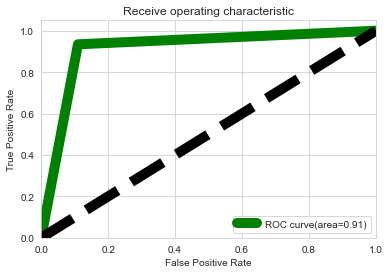

In [275]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds= roc_curve(pred_test,y_test)
roc_auc = auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='green',lw=10,label='ROC curve(area=%0.2f)' % roc_auc)

plt.plot([0,1],[0,1],color='black',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receive operating characteristic")
plt.legend(loc="lower right")
plt.show()

# Model2 Random Forest Classifier

In [253]:
#random Forest Training and score
rfc.fit(x_train,y_train)
rfc_score=rfc.score(x_train,y_train)

#predict random Forest
pred_train=rfc.predict(x_train)
pred_test=rfc.predict(x_test)
      
#result random Forest
print("Accuracy Training Score =",accuracy_score(y_train,pred_train)," Accuracy Test Score =",accuracy_score(y_test,pred_test),"\n")
print("Training Confusion_Matrix \n",confusion_matrix(y_train,pred_train),"Testing Confusion_Matrix \n",confusion_matrix(y_test,pred_test))
print("Classification Report \n",classification_report(y_test,pred_test))

Accuracy Training Score = 1.0  Accuracy Test Score = 0.8571428571428571 

Training Confusion_Matrix 
 [[597   0]
 [  0 606]] Testing Confusion_Matrix 
 [[143  12]
 [ 31 115]]
Classification Report 
               precision    recall  f1-score   support

           0       0.82      0.92      0.87       155
           1       0.91      0.79      0.84       146

    accuracy                           0.86       301
   macro avg       0.86      0.86      0.86       301
weighted avg       0.86      0.86      0.86       301



## Model Cross Validation

In [254]:
#train and score
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

#cross val for model
for i in range(2,10):
    cv_rfc_score=cross_val_score(rfc,x,y,cv=i)
    cv_mean=cv_rfc_score.mean()
    
    #print
    print("A cross-fold ",i,"CV_mean ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  2 CV_mean  0.7779255319148937 Training Score  1.0 Testing Score  0.8571428571428571
A cross-fold  3 CV_mean  0.8166018560488585 Training Score  1.0 Testing Score  0.8571428571428571
A cross-fold  4 CV_mean  0.8404255319148937 Training Score  1.0 Testing Score  0.8571428571428571
A cross-fold  5 CV_mean  0.8464651162790698 Training Score  1.0 Testing Score  0.8571428571428571
A cross-fold  6 CV_mean  0.8492058432934928 Training Score  1.0 Testing Score  0.8571428571428571
A cross-fold  7 CV_mean  0.8531157822833546 Training Score  1.0 Testing Score  0.8571428571428571
A cross-fold  8 CV_mean  0.8477393617021276 Training Score  1.0 Testing Score  0.8571428571428571
A cross-fold  9 CV_mean  0.8538597408357887 Training Score  1.0 Testing Score  0.8571428571428571


### Selected Cross Fold-9 as cv score is close to Testing Score

In [255]:
#train and score
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

# model cross val score
rfc_cv_score=cross_val_score(rfc,x,y,cv=9) 
rfc_mean=rfc_cv_score.mean()# mean value

print(" CV_mean ",rfc_mean,"Testing Accuracy Score ",test_accuracy)

 CV_mean  0.8565012831479897 Testing Accuracy Score  0.8571428571428571


## Model Graph

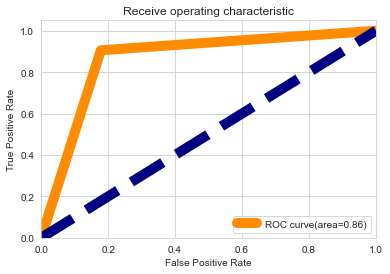

In [256]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds= roc_curve(pred_test,y_test)
roc_auc = auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve(area=%0.2f)' % roc_auc)

plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receive operating characteristic")
plt.legend(loc="lower right")
plt.show()

# Boosting Technique 

## Model3: ADA BOOST Classifier

In [251]:
ada.fit(x_train,y_train)
ada_score=ada.score(x_train,y_train)

#predict
pred_train=ada.predict(x_train)
pred_test=ada.predict(x_test)

#result
print("Accuracy Training Score =",accuracy_score(y_train,pred_train)," Accuracy Test Score =",accuracy_score(y_test,pred_test),"\n")
print("Training Confusion_Matrix \n",confusion_matrix(y_train,pred_train),"Testing Confusion_Matrix \n",confusion_matrix(y_test,pred_test))
print("Classification Report \n",classification_report(y_test,pred_test))

Accuracy Training Score = 0.8312551953449709  Accuracy Test Score = 0.8073089700996677 

Training Confusion_Matrix 
 [[506  91]
 [112 494]] Testing Confusion_Matrix 
 [[129  26]
 [ 32 114]]
Classification Report 
               precision    recall  f1-score   support

           0       0.80      0.83      0.82       155
           1       0.81      0.78      0.80       146

    accuracy                           0.81       301
   macro avg       0.81      0.81      0.81       301
weighted avg       0.81      0.81      0.81       301



## Model Cross Validation

In [252]:
#train and score for Ada Boost
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

#cross val for Ada Boost
for i in range(2,10):
    cv_ada_score=cross_val_score(ada,x,y,cv=i)
    cv_mean=cv_ada_score.mean()
    
    #print
    print("A cross-fold ",i,"CV_mean ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  2 CV_mean  0.730718085106383 Training Score  0.8312551953449709 Testing Score  0.8073089700996677
A cross-fold  3 CV_mean  0.7508038372126928 Training Score  0.8312551953449709 Testing Score  0.8073089700996677
A cross-fold  4 CV_mean  0.7646276595744681 Training Score  0.8312551953449709 Testing Score  0.8073089700996677
A cross-fold  5 CV_mean  0.7746467331118494 Training Score  0.8312551953449709 Testing Score  0.8073089700996677
A cross-fold  6 CV_mean  0.7667729083665339 Training Score  0.8312551953449709 Testing Score  0.8073089700996677
A cross-fold  7 CV_mean  0.7693575930698294 Training Score  0.8312551953449709 Testing Score  0.8073089700996677
A cross-fold  8 CV_mean  0.7839095744680851 Training Score  0.8312551953449709 Testing Score  0.8073089700996677
A cross-fold  9 CV_mean  0.7873499033678675 Training Score  0.8312551953449709 Testing Score  0.8073089700996677


### Selected Cross Fold-9 as cv score is close to Testing Score

In [257]:
#Model_predict test
ada_test=ada.predict(x_test)

#cross val score
ada_cv_score=cross_val_score(ada,x,y,cv=9) 
ada_mean=ada_cv_score.mean()

print(" CV_mean ",ada_mean,"Testing Accuracy Score ",accuracy_score(y_test,ada_test))

 CV_mean  0.7873499033678675 Testing Accuracy Score  0.8073089700996677


## Model Graph

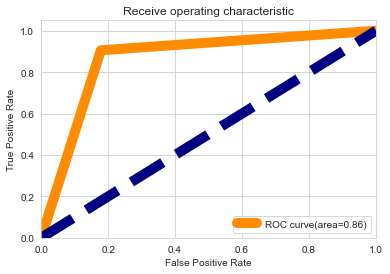

In [258]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds= roc_curve(pred_test,y_test)
roc_auc = auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve(area=%0.2f)' % roc_auc)

plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receive operating characteristic")
plt.legend(loc="lower right")
plt.show()

# Gradient Boosting

In [259]:
#train and score gradient Boosting Classifier
gbc.fit(x_train,y_train)
gbc_score=gbc.score(x_train,y_train)

#predict Gradient Boosting Classifier
pred_train=gbc.predict(x_train)
pred_test=gbc.predict(x_test)

#result gradient Boosting classifier
print("Accuracy Training Score =",accuracy_score(y_train,pred_train)," Accuracy Test Score =",accuracy_score(y_test,pred_test),"\n")
print("Training Confusion_Matrix \n",confusion_matrix(y_train,pred_train),"Testing Confusion_Matrix \n",confusion_matrix(y_test,pred_test))
print("Classification Report \n",classification_report(y_test,pred_test))

Accuracy Training Score = 0.940149625935162  Accuracy Test Score = 0.8438538205980066 

Training Confusion_Matrix 
 [[584  13]
 [ 59 547]] Testing Confusion_Matrix 
 [[139  16]
 [ 31 115]]
Classification Report 
               precision    recall  f1-score   support

           0       0.82      0.90      0.86       155
           1       0.88      0.79      0.83       146

    accuracy                           0.84       301
   macro avg       0.85      0.84      0.84       301
weighted avg       0.85      0.84      0.84       301



## Model Cross Validation

In [260]:
#predict model 
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

#cross val
for i in range(2,10):
    cv_gbc_score=cross_val_score(gbc,x,y,cv=i)
    cv_mean=cv_gbc_score.mean()
    
    #print
    print("A cross-fold ",i,"CV_mean ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  2 CV_mean  0.7652925531914894 Training Score  0.940149625935162 Testing Score  0.8438538205980066
A cross-fold  3 CV_mean  0.7687904403676048 Training Score  0.940149625935162 Testing Score  0.8438538205980066
A cross-fold  4 CV_mean  0.8065159574468086 Training Score  0.940149625935162 Testing Score  0.8438538205980066
A cross-fold  5 CV_mean  0.821873754152824 Training Score  0.940149625935162 Testing Score  0.8438538205980066
A cross-fold  6 CV_mean  0.8213120849933598 Training Score  0.940149625935162 Testing Score  0.8438538205980066
A cross-fold  7 CV_mean  0.8218896513180365 Training Score  0.940149625935162 Testing Score  0.8438538205980066
A cross-fold  8 CV_mean  0.8284574468085106 Training Score  0.940149625935162 Testing Score  0.8438538205980066
A cross-fold  9 CV_mean  0.8279433197097866 Training Score  0.940149625935162 Testing Score  0.8438538205980066


### Selected Cross Fold-9 as cv score is close to Testing Score

In [261]:
#predict model 
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

#cross val score
gbc_cv_score=cross_val_score(gbc,x,y,cv=9)
gbc_mean=gbc_cv_score.mean()

print(" CV_mean ",gbc_mean,"Testing Accuracy Score ",test_accuracy)

 CV_mean  0.8266126477204321 Testing Accuracy Score  0.8438538205980066


## Model Graph

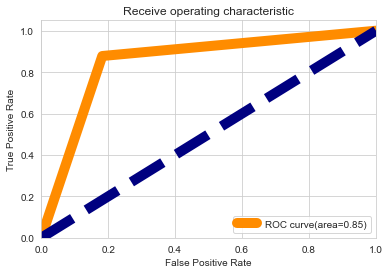

In [262]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds= roc_curve(pred_test,y_test)
roc_auc = auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve(area=%0.2f)' % roc_auc)

plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receive operating characteristic")
plt.legend(loc="lower right")
plt.show()

# MLP CLASSIFIER

In [266]:
#train
mlp.fit(x_train,y_train)
mlp_score=mlp.score(x_train,y_train)

#predict
pred_train=mlp.predict(x_train)
pred_test=mlp.predict(x_test)

#result
print("Accuracy Training Score =",accuracy_score(y_train,pred_train)," Accuracy Test Score =",accuracy_score(y_test,pred_test),"\n")
print("Training Confusion_Matrix \n",confusion_matrix(y_train,pred_train),"Testing Confusion_Matrix \n",confusion_matrix(y_test,pred_test))
print("Classification Report \n",classification_report(y_test,pred_test))

Accuracy Training Score = 0.8719866999168745  Accuracy Test Score = 0.717607973421927 

Training Confusion_Matrix 
 [[518  79]
 [ 75 531]] Testing Confusion_Matrix 
 [[111  44]
 [ 41 105]]
Classification Report 
               precision    recall  f1-score   support

           0       0.73      0.72      0.72       155
           1       0.70      0.72      0.71       146

    accuracy                           0.72       301
   macro avg       0.72      0.72      0.72       301
weighted avg       0.72      0.72      0.72       301



## Model Cross Validation

In [267]:
# accuracy_score
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

#cross val
for i in range(2,10):
    cv_mlp_score=cross_val_score(mlp,x,y,cv=i)
    cv_mean=cv_mlp_score.mean()
    
    #print
    print("A cross-fold ",i,"CV_mean ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  2 CV_mean  0.7646276595744681 Training Score  0.8719866999168745 Testing Score  0.717607973421927
A cross-fold  3 CV_mean  0.7161029865899012 Training Score  0.8719866999168745 Testing Score  0.717607973421927
A cross-fold  4 CV_mean  0.7978723404255319 Training Score  0.8719866999168745 Testing Score  0.717607973421927
A cross-fold  5 CV_mean  0.7314042081949058 Training Score  0.8719866999168745 Testing Score  0.717607973421927
A cross-fold  6 CV_mean  0.8045710491367862 Training Score  0.8719866999168745 Testing Score  0.717607973421927
A cross-fold  7 CV_mean  0.80124817586239 Training Score  0.8719866999168745 Testing Score  0.717607973421927
A cross-fold  8 CV_mean  0.8071808510638299 Training Score  0.8719866999168745 Testing Score  0.717607973421927
A cross-fold  9 CV_mean  0.8045892342299529 Training Score  0.8719866999168745 Testing Score  0.717607973421927


### Selected Cross Fold-8 as cv score is close to Testing Score

In [268]:
# accuracy_score
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

#cross val score
mlp_cv_score=cross_val_score(mlp,x,y,cv=8)
cv_mean=mlp_cv_score.mean()

print(" CV_mean ",cv_mean,"Testing Accuracy Score ",test_accuracy)

 CV_mean  0.8125 Testing Accuracy Score  0.717607973421927


## Model Graph

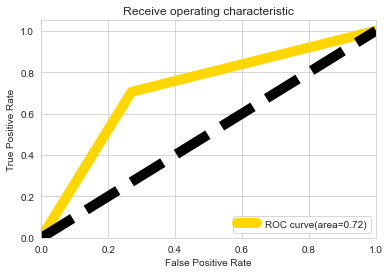

In [269]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds= roc_curve(pred_test,y_test)
roc_auc = auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='gold',lw=10,label='ROC curve(area=%0.2f)' % roc_auc)

plt.plot([0,1],[0,1],color='black',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receive operating characteristic")
plt.legend(loc="lower right")
plt.show()

# Model with Hyper-Paramter

#### Almost all the models are working in near 80s. I Selected: Extra Tress  and Random Forest Classifier due to following result:

- Model CV_Score is far better.
- Model Testing score and Training accuracy is far better then other Models.
- Model Cv_score is close to testing score

# Grid Search: Random Forest Classifier

In [276]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

rfc= RandomForestClassifier()

#Parameter  
parameters={'n_estimators':[100],
            'criterion':['gini', 'entropy', 'log_loss'],
            'n_jobs':[2,4],
           'max_features':['sqrt', 'log2','None'],
           'random_state':[302]}

gsv=GridSearchCV(rfc,parameters,cv=9,verbose=0)
gsv.fit(x_train,y_train)

print("Best Parameter ",gsv.best_params_,"Best Score ",gsv.best_score_)

Best Parameter  {'criterion': 'entropy', 'max_features': 'log2', 'n_estimators': 100, 'n_jobs': 2, 'random_state': 302} Best Score  0.8562014488958715


In [279]:
rfc=RandomForestClassifier( criterion='entropy', max_features= 'sqrt', n_estimators= 100,n_jobs= 10,random_state=504,
                           min_samples_split=2,min_samples_leaf=1,min_weight_fraction_leaf=0.00000001,min_impurity_decrease=0.00000001,
                           ccp_alpha=0.000001,verbose=0,max_depth=77)

#random Forest Training and score
rfc.fit(x_train,y_train)
rfc.score(x_train,y_train)

#predict random Forest
pred_train2=rfc.predict(x_train)
pred_test2=rfc.predict(x_test)

      
#result random Forest
print("Train_Score",rfc.score(x_train,y_train))
print("Accuracy Training Score =",accuracy_score(y_train,pred_train2)," Accuracy Test Score =",accuracy_score(y_test,pred_test2),"\n")
print("Training Confusion_Matrix \n",confusion_matrix(y_train,pred_train2),"Testing Confusion_Matrix \n",confusion_matrix(y_test,pred_test2))
print("Classification Report \n",classification_report(y_test,pred_test2))

Train_Score 1.0
Accuracy Training Score = 1.0  Accuracy Test Score = 0.8604651162790697 

Training Confusion_Matrix 
 [[597   0]
 [  0 606]] Testing Confusion_Matrix 
 [[143  12]
 [ 30 116]]
Classification Report 
               precision    recall  f1-score   support

           0       0.83      0.92      0.87       155
           1       0.91      0.79      0.85       146

    accuracy                           0.86       301
   macro avg       0.87      0.86      0.86       301
weighted avg       0.87      0.86      0.86       301



## Model Cross Validation

In [280]:
#Accuracy_Score
train_accuracy=accuracy_score(y_train,pred_train2)
test_accuracy=accuracy_score(y_test,pred_test2)

#cross val
for i in range(2,10):
    cv_rfc_score=cross_val_score(rfc,x,y,cv=i)
    cv_mean=cv_rfc_score.mean()
    
    #print
    print("A cross-fold ",i,"CV_Score ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  2 CV_Score  0.7918882978723405 Training Score  1.0 Testing Score  0.8604651162790697
A cross-fold  3 CV_Score  0.8252525493501709 Training Score  1.0 Testing Score  0.8604651162790697
A cross-fold  4 CV_Score  0.8357712765957448 Training Score  1.0 Testing Score  0.8604651162790697
A cross-fold  5 CV_Score  0.8424695459579181 Training Score  1.0 Testing Score  0.8604651162790697
A cross-fold  6 CV_Score  0.8458857901726429 Training Score  1.0 Testing Score  0.8604651162790697
A cross-fold  7 CV_Score  0.8564535659949699 Training Score  1.0 Testing Score  0.8604651162790697
A cross-fold  8 CV_Score  0.8510638297872342 Training Score  1.0 Testing Score  0.8604651162790697
A cross-fold  9 CV_Score  0.864481354750816 Training Score  1.0 Testing Score  0.8604651162790697


### Selected Cross Fold-9 as cv score is close to Testing Score

In [281]:
#Accuracy_Score
train_accuracy=accuracy_score(y_train,pred_train2)
test_accuracy=accuracy_score(y_test,pred_test2)

#cross val score
rfc_cv_score=cross_val_score(rfc,x,y,cv=9)
rfc_mean=rfc_cv_score.mean()

print(" CV_mean ",rfc_mean,"Testing Accuracy Score ",test_accuracy)

 CV_mean  0.864481354750816 Testing Accuracy Score  0.8604651162790697


## Model Graph

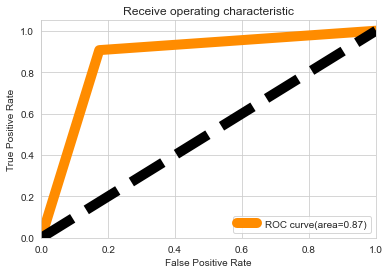

In [282]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds= roc_curve(pred_test2,y_test)
roc_auc = auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve(area=%0.2f)' % roc_auc)

plt.plot([0,1],[0,1],color='black',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receive operating characteristic")
plt.legend(loc="lower right")
plt.show()

### CV score Increased by by 2 present cv score for model is 87 percentage

# Grid Search [ EXTRA TREES]

In [283]:
# importing library Grid Search CV
from sklearn.model_selection import GridSearchCV

parameters={'n_estimators':[100,180,200],
             'criterion':['gini', 'entropy', 'log_loss'],
             'min_samples_split': [2,3,4],
             'max_features':['auto','log2', 'None'],
           'random_state':[302,504]}

gsv=GridSearchCV(etc,param_grid=parameters,cv=9)
gsv.fit(x_train,y_train)

print("Best Parameter ",gsv.best_params_,"Best Score ",gsv.best_score_)

Best Parameter  {'criterion': 'gini', 'max_features': 'auto', 'min_samples_split': 3, 'n_estimators': 180, 'random_state': 302} Best Score  0.9069003354156536


In [292]:
from sklearn.ensemble import ExtraTreesClassifier
etc=ExtraTreesClassifier(criterion='gini', max_features= 'auto', min_samples_split= 4 ,n_estimators= 180, n_jobs= 5,
                         min_impurity_decrease=0.0000001,random_state=302,class_weight='balanced_subsample',verbose=0,
                         ccp_alpha=0.0001,max_samples=None,min_weight_fraction_leaf=0.00001)

#train and score
etc.fit(x_train,y_train)
etc.score(x_train,y_train)

#predict
pred_train=etc.predict(x_train)
pred_test=etc.predict(x_test)

#result
print("Training Accuracy_score ",accuracy_score(y_train,pred_train)," Testing Accuracy_score ",accuracy_score(y_test,pred_test))
print("Training Confusion_Matrics ",confusion_matrix(y_train,pred_train)," Testing Confusion Matrics ",confusion_matrix(y_test,pred_test))
print("Classification Report \n",classification_report(y_test,pred_test))

Training Accuracy_score  1.0  Testing Accuracy_score  0.9169435215946844
Training Confusion_Matrics  [[597   0]
 [  0 606]]  Testing Confusion Matrics  [[149   6]
 [ 19 127]]
Classification Report 
               precision    recall  f1-score   support

           0       0.89      0.96      0.92       155
           1       0.95      0.87      0.91       146

    accuracy                           0.92       301
   macro avg       0.92      0.92      0.92       301
weighted avg       0.92      0.92      0.92       301



## Model Cross Validation

In [293]:
#Accuracy_Score
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

#cross val
for i in range(2,10):
    cv_etc_score=cross_val_score(etc,x,y,cv=i)
    cv_mean=cv_etc_score.mean()
    
    #print
    print("A cross-fold ",i,"CV_Score ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  2 CV_Score  0.8484042553191489 Training Score  1.0 Testing Score  0.9169435215946844
A cross-fold  3 CV_Score  0.8856947459662349 Training Score  1.0 Testing Score  0.9169435215946844
A cross-fold  4 CV_Score  0.90625 Training Score  1.0 Testing Score  0.9169435215946844
A cross-fold  5 CV_Score  0.9076101882613511 Training Score  1.0 Testing Score  0.9169435215946844
A cross-fold  6 CV_Score  0.9103134130146083 Training Score  1.0 Testing Score  0.9169435215946844
A cross-fold  7 CV_Score  0.9129443909709068 Training Score  1.0 Testing Score  0.9169435215946844
A cross-fold  8 CV_Score  0.9202127659574468 Training Score  1.0 Testing Score  0.9169435215946844
A cross-fold  9 CV_Score  0.9236130912777618 Training Score  1.0 Testing Score  0.9169435215946844


### Selected Cross Fold-9 as cv score is close to Testing Score

In [294]:
#Accuracy_Score
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

#cross val score
etc_cv_score=cross_val_score(etc,x,y,cv=9)
etc_mean=etc_cv_score.mean()

print(" CV_mean ",etc_mean,"Testing Accuracy Score ",test_accuracy)

 CV_mean  0.9236130912777618 Testing Accuracy Score  0.9169435215946844


## Graph

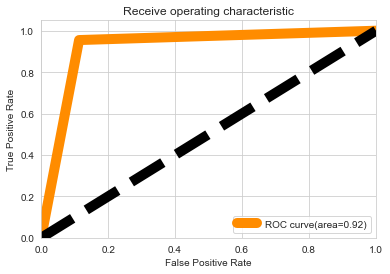

In [295]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds= roc_curve(pred_test,y_test)
roc_auc = auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve(area=%0.2f)' % roc_auc)

plt.plot([0,1],[0,1],color='black',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receive operating characteristic")
plt.legend(loc="lower right")
plt.show()

### However Both the Models are working well...

## I would select Extra Tress Classifier at the best of 92 percentage

- Selecting Extra Trees as Testing accuracy score and Training score little better along with cv score is better

- CV score increased Present CV_Score is 92 percentage got increased after Hyperparameter.

# Saving Model

In [297]:
import pickle
pickle.dump(etc,open('autofraud.pkl','wb'))

In [298]:
# Loading Model Model
import pickle
loaded_model =pickle.load(open('autofraud.pkl','rb'))
result=loaded_model.score(x_test,y_test)
print(result*100)

91.69435215946844


In [299]:
model=pd.DataFrame([loaded_model.predict(x_test)[:],pred_test[:]],index=["Predicted","Original"])
model

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300
Predicted,1,0,0,0,0,0,1,1,1,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,1,1,0,0,0,0,1,1,0,1,1,0,0,1,0,0,0,0,1,1,1,1,1,1,1,1,0,1,1,0,1,0,0,1,0,0,1,0,0,1,0,1,0,0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,1,0,1,1,0,1,0,0,1,1,0,1,0,1,0,0,0,1,0,1,0,1,0,1,0,0,1,0,0,0,1,0,0,1,1,1,1,0,0,0,0,0,0,0,1,1,0,1,1,1,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0,1,1,1,0,1,0,0,1,0,1,1,1,0,1,1,0,1,1,0,0,1,0,0,1,0,0,1,1,0,1,0,0,0,0,0,0,0,1,1,1,0,0,1,0,1,1,1,1,1,0,0,1,0,0,0,1,1,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,1,0,1,1,1,1,1,0,1,0,1,1,1,1,0,1,1,0,0,0,0,0,0,1,1,0,0,1,0,1,0,0,1,1,1,1,1,0,0,1,1,0,1,0,0,1,1,1,1,0,1,0,1,0,0,0,1,0,1,1,1,0,0,0,0,0,0
Original,1,0,0,0,0,0,1,1,1,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,1,1,0,0,0,0,1,1,0,1,1,0,0,1,0,0,0,0,1,1,1,1,1,1,1,1,0,1,1,0,1,0,0,1,0,0,1,0,0,1,0,1,0,0,0,1,1,1,1,0,0,0,1,0,0,0,0,0,1,0,1,1,0,1,0,0,1,1,0,1,0,1,0,0,0,1,0,1,0,1,0,1,0,0,1,0,0,0,1,0,0,1,1,1,1,0,0,0,0,0,0,0,1,1,0,1,1,1,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0,1,1,1,0,1,0,0,1,0,1,1,1,0,1,1,0,1,1,0,0,1,0,0,1,0,0,1,1,0,1,0,0,0,0,0,0,0,1,1,1,0,0,1,0,1,1,1,1,1,0,0,1,0,0,0,1,1,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,1,0,1,1,1,1,1,0,1,0,1,1,1,1,0,1,1,0,0,0,0,0,0,1,1,0,0,1,0,1,0,0,1,1,1,1,1,0,0,1,1,0,1,0,0,1,1,1,1,0,1,0,1,0,0,0,1,0,1,1,1,0,0,0,0,0,0
